Module Code: ST1504 DELE

Name: Yadanar Aung

Admin No.: 2214621

Class: DAAA/FT/2B/07

CA1: Part A Convolutional Neural Network

<hr>
<h3>Importing Libraries</h3>

In [1]:
import tensorflow as tf

# Check GPU is available
gpus = tf.config.experimental.list_physical_devices('GPU')

# Memory control: Prevent tensorflow from allocating totality of GPU memory
for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)

In [2]:
# Directory & File Handling
import os
import random

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Preprocessing Data
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras import layers

# Building CNN Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization

# Callbacks
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint

<hr>
<h3><mark>Define Task</mark></h3>
<p> ↳ Implement an <u>image classifier</u> using a deep learning network.</p>

- Given colour images of 224 by 224 pixels, containing 15 types of vegetables.<br><br>
- Convert given images into <u>grayscale</u> (i.e. only 1 channel instead of 3).<br><br>
- Build <mark><b>two types of neural networks</b></mark>, one for each input size:
    - <u>31 by 31</u> pixels
    - <u>128 by 128</u> pixels<br><br>
- Compare & discuss classification accuracies for each input size.

<hr>
<h2><mark>1. Background Research</mark></h2>


Vegetables are all around us. They are grown and havested in farms and then sold at market places for consumers to consume.

- Main colour group of vegetables:
    1. Red
    2. Orange/Yellow
    3. White/Brown
    4. Green
    5. Blue/Purple

- Some vegetables have distinct features making it easy to identify them, whereas others are harder to tell apart.

Sources:<br>
https://www.vegetables.co.nz/healthy-living/health/eat-your-colours/#:~:text=Vegetables%20can%20be%20divided%20into,green%2C%20and%20blue%2Fpurple.

<hr>
<h2><mark>2. Data Understanding</mark></h2>

- Import Datasets (train, validation & test)
- Exploratory Data Analysis

<h3><b>Dataset Folder: Dataset for CA1 part A</b></h3>

We are provided with a 'Dataset for CA1 part A' Dataset with 3 sub folders named 'train', 'validation', & 'test'.

- Given color images of <u>224 by 224</u> pixels.
- Contains <u>15 types of vegetables</u>.

In [3]:
# Define train, validation & test dataset paths
train_path = 'Data/Dataset for CA1 part A/train'
validation_path = 'Data/Dataset for CA1 part A/validation'
test_path = 'Data/Dataset for CA1 part A/test'

<h3><b>Basic Information of Dataset</b></h3>

- Total of 15,028 colored images of size 224 by 224 pixels.<br><br>
- Total of 3 Sub-datasets:
    - Train: 9028 images (60%)
    - Validation: 3000 images (20%)
    - Test: 3000 images (20%) <br><br>
- 15 Classes to Predict: 
    - 'Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato'

<h3><b>Import Train, Validation & Test Datasets</b></h3>

Use tf.keras.utils.image_dataset_from_directory. This will make a BatchDataset object.
- label_mode = 'categorical': labels data as categorical
- image_size: indicate image size to be resized so that it matches the size that model will handle

Source(s): 
- https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory
- https://www.tensorflow.org/tutorials/load_data/images

<h5>1. Dataset with <u>3 colour channels</u> & <u>size of 224 by 224 pixels</u></h5>

In [4]:
# Load Dataset for CA1 part A dataset
print("Train Dataset:")
train_ds = image_dataset_from_directory(train_path, labels = 'inferred', label_mode = 'categorical', image_size=(224, 224), batch_size=32)

print("\nValidation Dataset:")
validation_ds = image_dataset_from_directory(validation_path, labels = 'inferred', label_mode = 'categorical', image_size=(224, 224), batch_size=32)

print("\nTest Dataset:")
test_ds = image_dataset_from_directory(test_path, labels = 'inferred', label_mode = 'categorical', image_size=(224, 224), batch_size=32)

Train Dataset:
Found 9028 files belonging to 15 classes.

Validation Dataset:
Found 3000 files belonging to 15 classes.

Test Dataset:
Found 3000 files belonging to 15 classes.


<h5>2. Dataset with <u>1 colour channel</u> & size of <u>128 by 128 pixels</u></h5>

In [5]:
# Grayscale Color & Resize to 128 by 128 pixels
print("Train Dataset:")
train_ds_128 = image_dataset_from_directory(train_path, labels = 'inferred', label_mode = 'categorical', color_mode = 'grayscale', image_size = (128, 128), batch_size=32)

print("\nValidation Dataset:")
validation_ds_128 = image_dataset_from_directory(validation_path, labels = 'inferred', label_mode = 'categorical', color_mode = 'grayscale', image_size = (128, 128), batch_size=32)

print("\nTest Dataset:")
test_ds_128 = image_dataset_from_directory(test_path, labels = 'inferred', label_mode = 'categorical', color_mode = 'grayscale', image_size = (128, 128), batch_size=32)

Train Dataset:


Found 9028 files belonging to 15 classes.

Validation Dataset:
Found 3000 files belonging to 15 classes.

Test Dataset:
Found 3000 files belonging to 15 classes.


<h5>3. Dataset with <u>1 color chanel</u> & size of <u>31 by 31 pixels</u></h5>

In [6]:
# Grayscale Color & Rezize to 31 by 31 pixels
print("Train Dataset:")
train_ds_31 = image_dataset_from_directory(train_path, labels = 'inferred', label_mode = 'categorical', color_mode = 'grayscale', image_size = (31, 31), batch_size=32)

print("\nValidation Dataset:")
validation_ds_31 = image_dataset_from_directory(validation_path, labels = 'inferred', label_mode = 'categorical', color_mode = 'grayscale', image_size = (31, 31), batch_size=32)

print("\nTest Dataset:")
test_ds_31 = image_dataset_from_directory(test_path, labels = 'inferred', label_mode = 'categorical', color_mode = 'grayscale', image_size = (31, 31), batch_size=32)

Train Dataset:
Found 9028 files belonging to 15 classes.

Validation Dataset:
Found 3000 files belonging to 15 classes.

Test Dataset:
Found 3000 files belonging to 15 classes.


<h3>Obtain Class Labels</h3>

In [7]:
# Class labels
class_names = train_ds.class_names
num_classes = len(class_names)
class_names

['Bean',
 'Bitter_Gourd',
 'Bottle_Gourd',
 'Brinjal',
 'Broccoli',
 'Cabbage',
 'Capsicum',
 'Carrot',
 'Cauliflower',
 'Cucumber',
 'Papaya',
 'Potato',
 'Pumpkin',
 'Radish',
 'Tomato']

<hr>
<h3><mark><b>Exploratory Data Analysis</b></mark></h3>

- Check Class Balance of Train Dataset
- Visualise Images from Each 15 Classes

<h3><b>Check Class Balance of Train Dataset</b></h3>

In [8]:
# Counts the number of files in each subfolder in a directory
def count_files(dircetory):
    class_counts = {} # Dictionary to store counts for each class

    for dirpath, _, filenames in os.walk(dircetory):
        # Exclude main dircetory
        if dirpath != dircetory:
            class_name = os.path.basename(dirpath)

            file_count = sum(1 for file in filenames if os.path.isfile(os.path.join(dirpath, file)))
            
            class_counts[class_name] = file_count
    
    return class_counts

In [9]:
# Number of images per Class in Train Dataset
train_class_counts = count_files(train_path)
# Number of images per class in Validation Dataset
validation_class_counts = count_files(validation_path)
# Number of images per class in Test Dataset
test_class_counts = count_files(test_path)

num = {'Train': train_class_counts, 'Validation': validation_class_counts, 'Test': test_class_counts}
df = pd.DataFrame(data=num)
df.columns = [['Number of Images','Number of Images','Number of Images'], ['Train','Validation','Test']]
df

Number of Images                
                        Train Validation Test
Bean                      780        200  200
Bitter_Gourd              720        200  200
Bottle_Gourd              441        200  200
Brinjal                   868        200  200
Broccoli                  750        200  200
Cabbage                   503        200  200
Capsicum                  351        200  200
Carrot                    256        200  200
Cauliflower               587        200  200
Cucumber                  812        200  200
Papaya                    566        200  200
Potato                    377        200  200
Pumpkin                   814        200  200
Radish                    248        200  200
Tomato                    955        200  200

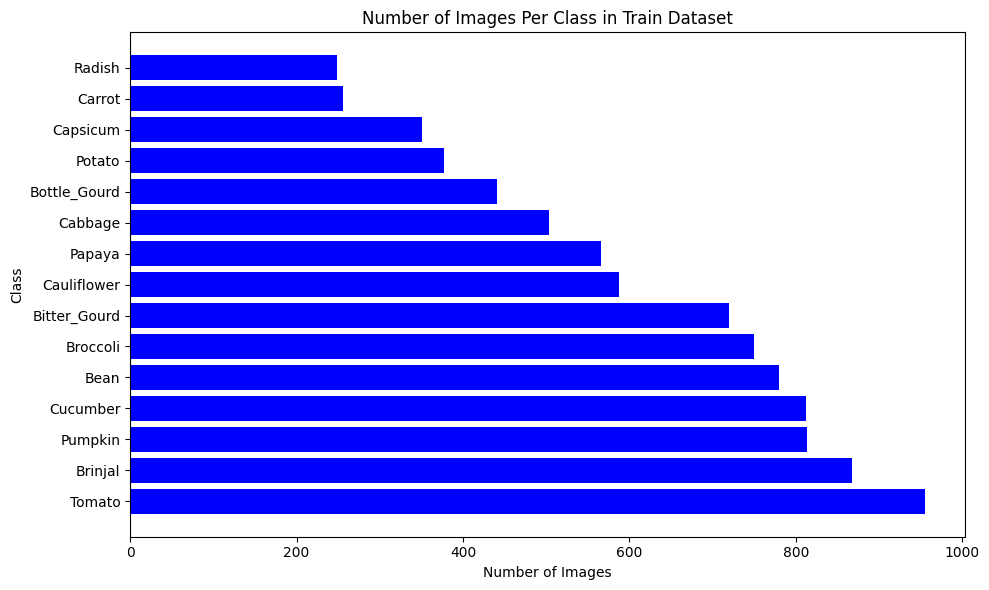

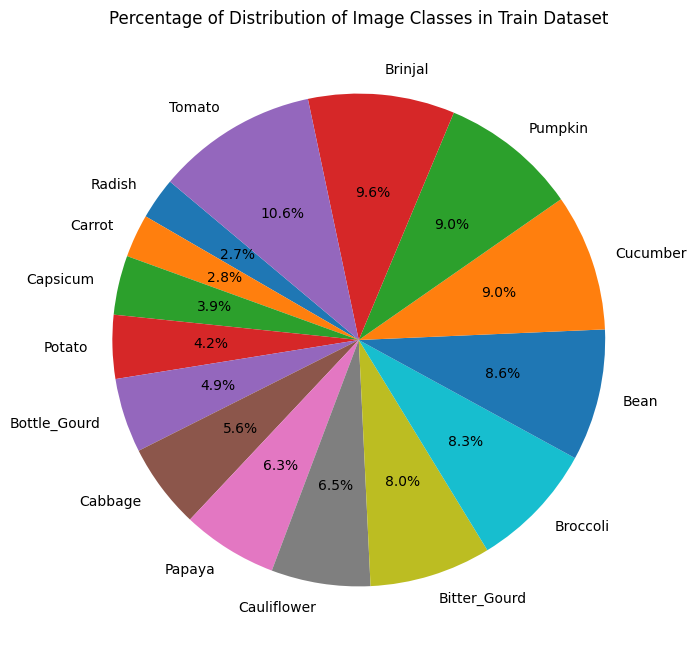

In [10]:
# Visualise Distribution of Image Classes

# Plot Bar Graph of image counts for each class
def plot_counts(class_counts):
    sortedClasses = sorted(class_counts.keys(), key=lambda x: class_counts[x], reverse=True)
    counts = [class_counts[class_name] for class_name in sortedClasses]

    plt.figure(figsize=(10, 6))
    plt.barh(sortedClasses, counts, color='blue')  # Use barh for horizontal bars
    plt.ylabel('Class')
    plt.xlabel('Number of Images')
    plt.title('Number of Images Per Class in Train Dataset')
    plt.tight_layout()  # Adjust layout for better display
    plt.show()

# Plot Pie Chart of image counts for each class
def plot_pie_chart(class_counts):
    sorted_classes = sorted(class_counts.keys(), key=lambda x: class_counts[x])
    sizes = [class_counts[class_name] for class_name in sorted_classes]

    plt.figure(figsize=(8, 8))
    plt.pie(sizes, labels=sorted_classes, autopct='%1.1f%%', startangle=140)
    plt.title('Percentage of Distribution of Image Classes in Train Dataset')
    plt.show()

plot_counts(train_class_counts)
plot_pie_chart(train_class_counts)

<u>Insights:</u>

- Training dataset is heavily imbalanced.

<u>Potential Setbacks:</u>
- Overfitting
- Action needs to be taken to address this issue:
    - Feature Engineering
    - Data Augmentation

<h2><b>Visualise Train Dataset</b></h2>

<h3><b>Visualise First Image from Each Vegetable Class In Original Size & Colour</b></h3>

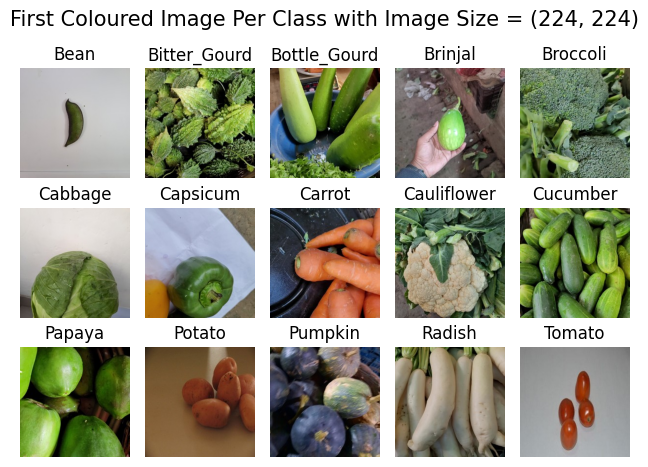

In [11]:
# Loop through each category and plot the first image from each
for i, category in enumerate(class_names):
    # Get the path to the first image in the current category folder
    category_path = os.path.join(train_path, category)
    images_in_folder = os.listdir(category_path)
    first_image_of_folder = images_in_folder[0]
    first_image_path = os.path.join(category_path, first_image_of_folder)

    # Load the image and convert it into a NumPy array, then normalize the values
    img = load_img(first_image_path, target_size = (224, 224))
    img_arr = img_to_array(img) / 255.0

    # Create a subplot and plot the image with its title and no axis
    # plt.subplot(rows, columns, index)
    plt.subplot(3, 5, i + 1)
    plt.imshow(img_arr)
    plt.title(category)
    plt.axis('off')

plt.suptitle(f'First Coloured Image Per Class with Image Size = {224, 224}', fontsize = 15)    
plt.tight_layout()
plt.show()

Insights:

Shape of the vegetables are commonly round, oval, circular, long.

With the Color of vegetables, it is easy for humans to identify, however if we were to pass it to computer vision.

<h3><b>Visualise First Image from Each Vegetable Class In Grayscale</b></h3>

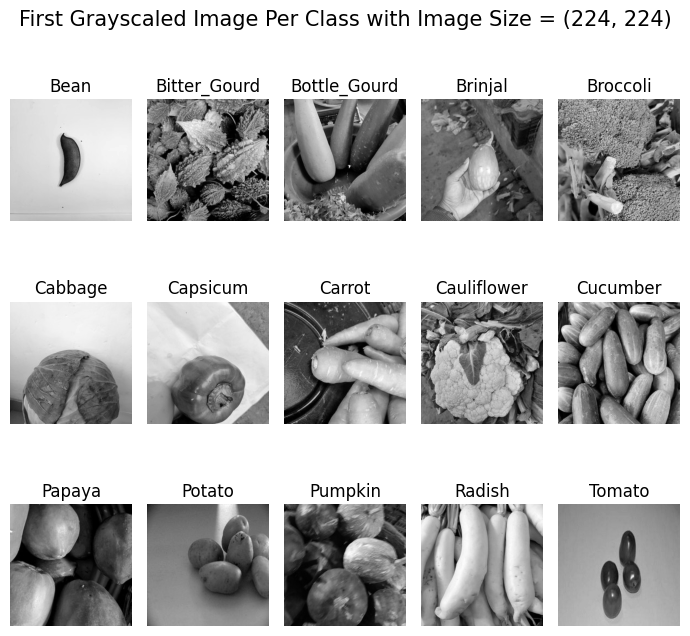

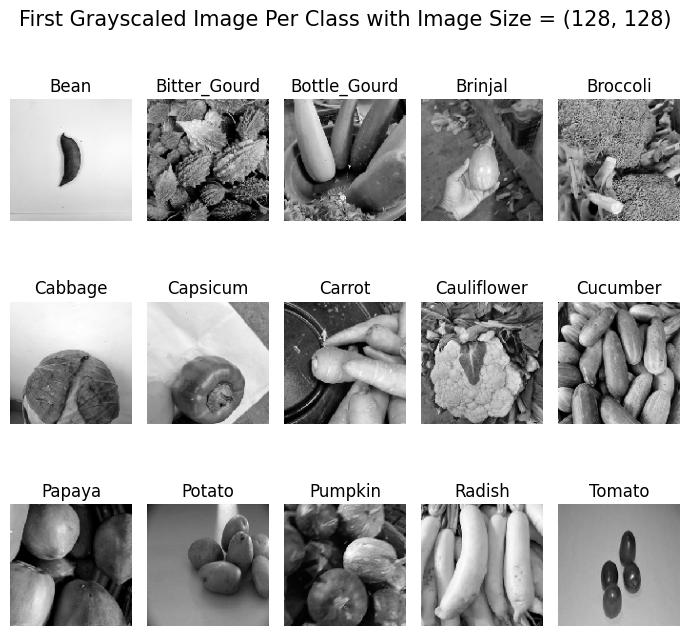

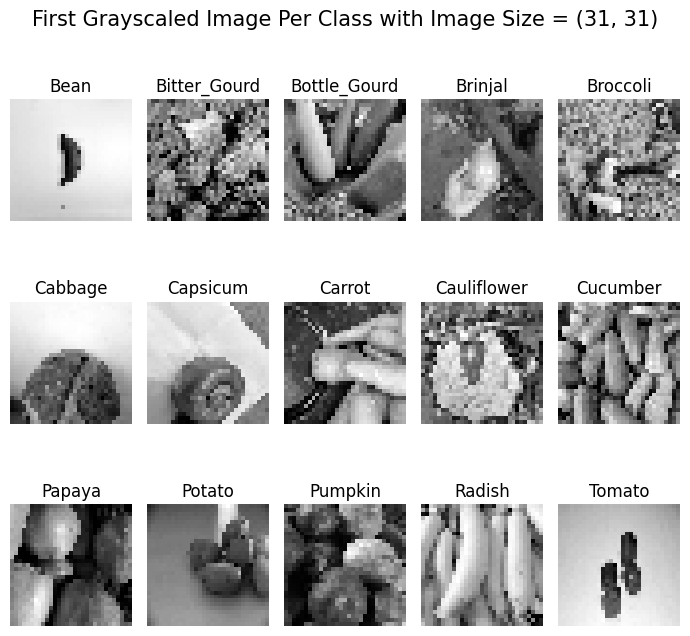

In [12]:
inputSizes = [(224, 224), (128, 128), (31, 31)]
for size in inputSizes:
    # Plot 1st Image from each class
    # Create figure & set size
    plt.figure(figsize=(7, 7))

    # Loop through each category and plot the first image from each
    for i, category in enumerate(class_names):
        # Get the path to the first image in the current category folder
        category_path = os.path.join(train_path, category)
        images_in_folder = os.listdir(category_path)
        first_image_of_folder = images_in_folder[0]
        first_image_path = os.path.join(category_path, first_image_of_folder)

        # Load the image and convert it into a NumPy array, then normalize the values
        img = load_img(first_image_path, target_size = size, color_mode='grayscale')
        img_arr = img_to_array(img) / 255.0

        # Create a subplot and plot the image with its title and no axis
        # plt.subplot(rows, columns, index)
        plt.subplot(3, 5, i + 1)
        plt.imshow(img_arr, cmap='gray')
        plt.title(category)
        plt.axis('off')

    plt.suptitle(f'First Grayscaled Image Per Class with Image Size = {size}', fontsize = 15)    
    plt.tight_layout()
    plt.show()

Insights:

Colour information is lost.

Common shapes of vegetable can cause confusion.

Leads to ambiguity as the vegetable is open to more than one interpretation.

<h3><b>Visualise Random Ten Images from Each Vegetable Class</b></h3>

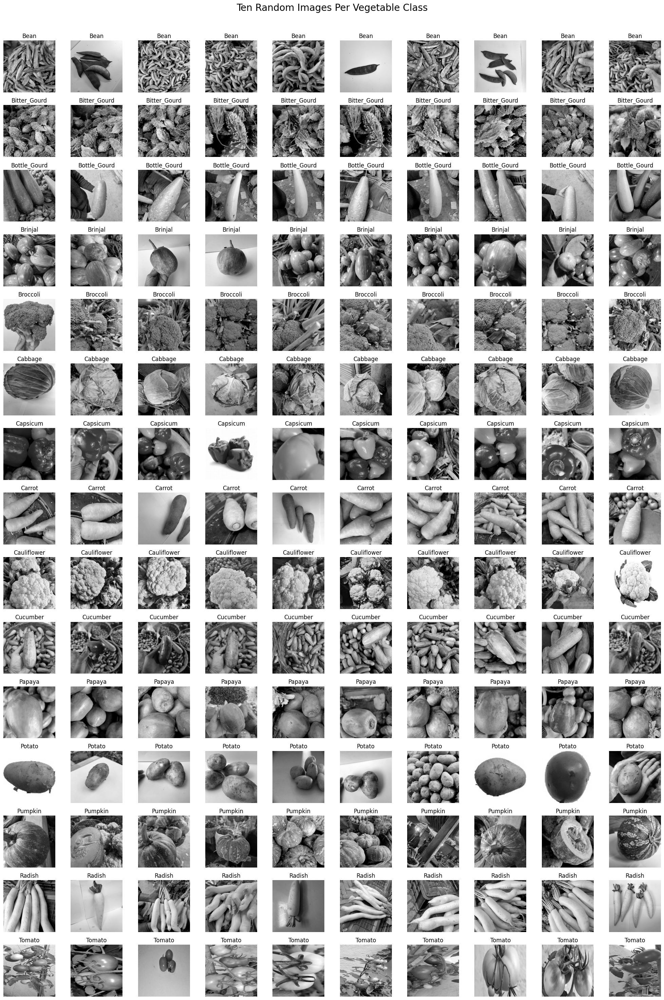

In [13]:
# Create figure & set size
plt.figure(figsize=(20, 30))

# Loop through each classLabel & plot ten random images from each
for i, classLabel in enumerate(class_names):
    # Get path to all images in current classLabel folder
    classLabel_path = os.path.join(train_path, classLabel)
    images_in_folder = os.listdir(classLabel_path)

    # Randomly select ten images from current classLabel
    random_images = random.sample(images_in_folder, 10)

    for j, image_name in enumerate(random_images):
        # Get path to current image
        image_path = os.path.join(classLabel_path, image_name)

        # Load image & convert into a NumPy array
        img = load_img(image_path, target_size = (224, 224), color_mode='grayscale')
        img_arr = img_to_array(img) / 255.0 # Normalize values

        # Create subplot & plot image with title & no axis
        plt.subplot(num_classes, 10, i * 10 + j + 1)
        plt.imshow(img_arr, cmap='gray')
        plt.title(classLabel)
        plt.axis('off')

plt.suptitle('Ten Random Images Per Vegetable Class', fontsize=20)
plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

<U>Insights:</U>

- Orientation not consistent in images.
- Background of images varies. Some are taken against surrondings, others with a white backdrop.
- Quantity of vegetables vary across images.
- Sizes of vegetables also vary across images
- There're absences & presences of hand in the images.
- Some images are stretched.
- Different perspectives of the vegetables are shown in the images.
    - E.g. Top View / Insides / Zoomed in
- In conclusion, <u>dataset is not clean & is noisy</u>.
<br><br>
- Based on random selection of images, appears to be <U>no clear indication of wrongly classified vegetables</U> from the dataset.

<hr>
<h2><mark>3. Data Pre-Processing</mark></h2>

<h3><b>One-Hot Encoding</b></h3>

We have already set the class labels to one-hot encode, when we import our train dataset using image_dataset_from_directory
- label_mode='categorical': TensorFlow automatically sets labels to be represented using one-hot encoding

Nevertheless, I will be checking the one-hot encoded vectors to ensure that it has been done so.

In [8]:
# Iterate through train_ds & print one-hot encoded class labels
for images, labels in train_ds:
    print("One-Hot Encoded Labels in First Batch Size of 32:")
    print(labels)
    break

One-Hot Encoded Labels in First Batch Size of 32:
tf.Tensor(
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0

<hr>
<h2><b>Handle Class Imbalance</b></h3>

As the class labels are imbalanced, I will be investigating if Data Augmentation will be beneficial to the model.
<h3><b>Data Augmentation</b></h3>

This generate additional training data from existing examples by augmenting them using random transformations that yield believable-looking images. Hence, exposes model to more aspects of data to generalize better.

This prevents overfitting that might have occured due to small number of training examples.

Source: <br>
https://www.tensorflow.org/tutorials/images/data_augmentation<br>
https://keras.io/api/layers/preprocessing_layers/image_augmentation/

Create Preprocessing layer to perform Data Augmentation

In [77]:
# Function to perform data augmentation on train dataset
def dataAug(ds):
    # Preprocessing layer for Data Augmentation
    data_augmentation = tf.keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical"),
        layers.RandomRotation(0.2),
        layers.RandomZoom(0.2)
    ])

    AUTOTUNE = tf.data.AUTOTUNE

    ds = ds.map(lambda x, y: (data_augmentation(x, training=True), y), 
                num_parallel_calls=AUTOTUNE)

    # Use buffered prefetching on all datasets.
    return ds.prefetch(buffer_size=AUTOTUNE)

Peform Data Augmentation on Train Dataset

In [78]:
train_ds_128_dataAug = dataAug(train_ds_128)
train_ds_31_dataAug = dataAug(train_ds_31)

Visualize Sample of Data Augmentated Images

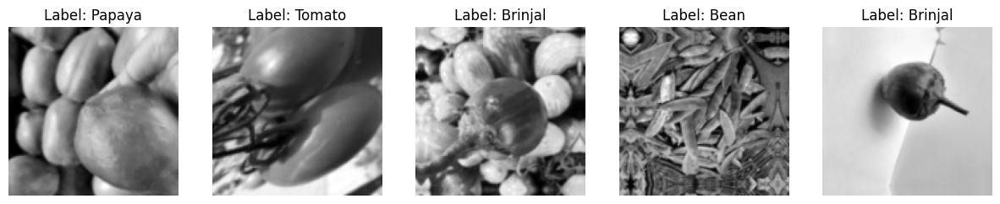

In [16]:
# Take a few batches from the dataset
augmented_batch = next(iter(train_ds_128_dataAug))

# Extract images & labels
images, labels = augmented_batch

# Convert labels to integers
label_indices = tf.argmax(labels, axis=1).numpy()

# Visualize the images
plt.figure(figsize=(15, 8))
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"), cmap='gray')
    plt.title(f"Label: {class_names[label_indices[i]]}")
    plt.axis("off")
plt.show()

Combine the original train dataset & data augmentated train dataset.

Now, we have double the number of train images at 18,112.

In [79]:
# Concatenate data augmentation dataset with original dataset
train_ds_128_dataAug = train_ds_128_dataAug.concatenate(train_ds_128)
train_ds_31_dataAug = train_ds_31_dataAug.concatenate(train_ds_31)

<hr>
<h3><b>Rescaling Input Pixel Values</b></h3>

A Neural Network learns its weights by continually adding gradient error vectors (multiplied by a learning rate) computed from backpropagation to various weights throughout the network as training samples are passed through.

Hence, it is important to normalize the inputs such that the ranges of distributions of feature values would not be different for each feature. Thus, not leading to the learning rate casuing corrections in each dimension that would differ proportionally from one another.

Normalizing the inputs is ideal as we do not want to find ourselves unable to center onto a better maxima in weights space state or in a slow moving to a better maxima state.

Source: https://stats.stackexchange.com/questions/185853/why-do-we-need-to-normalize-the-images-before-we-put-them-into-cnn

In [12]:
# Extract from dataset
for images, labels in train_ds_128_dataAug.take(1):
    # Print statistics
    print("Pixel Statistics for the original train dataset:")
    print(f"Minimum pixel value: {images.numpy().min()}")
    print(f"Maximum pixel value: {images.numpy().max()}")
    print(f"Mean pixel value: {images.numpy().mean()}")
    print(f"Standard deviation of pixel values: {images.numpy().std()}")

Pixel Statistics for the original train dataset:
Minimum pixel value: 0.0
Maximum pixel value: 253.56655883789062
Mean pixel value: 113.79469299316406
Standard deviation of pixel values: 51.41456985473633


Currently, the input pixel sizes are in the range [0, 255].

Hence, I am going to rescale the input pixel sizes to make the pixel sizes on the same scale, so that the neural network can converge during the gradient descent better.

I will rescale all 3 datasets of train, test & validation in order to maintain consistency.

I will rescale both train datasets with and without data augmentation for comparison later on.

In [80]:
# Rescale inputs from [0 - 255] to [0 - 1]

# Input size: 128 by 128 pixels
train_ds_128_rescaled = train_ds_128.map(lambda x, y: (x / 255.0, y))
train_ds_128_dataAug_rescaled = train_ds_128_dataAug.map(lambda x, y: (x / 255.0, y))
validation_ds_128_rescaled = validation_ds_128.map(lambda x, y: (x / 255.0, y))
test_ds_128_rescaled = test_ds_128.map(lambda x, y: (x / 255.0, y))

# Input size: 31 by 31 pixels
train_ds_31_rescaled = train_ds_31.map(lambda x, y: (x / 255.0, y))
train_ds_31_dataAug_rescaled = train_ds_31_dataAug.map(lambda x, y: (x / 255.0, y)) 
validation_ds_31_rescaled = validation_ds_31.map(lambda x, y: (x / 255.0, y))
test_ds_31_rescaled = test_ds_31.map(lambda x, y: (x / 255.0, y)) 

In [14]:
# Extract a batch from the normalized dataset
for images, labels in train_ds_128_dataAug_rescaled.take(1):
    # Print statistics
    print("Pixel Statistics for the normalized train dataset:")
    print(f"Minimum pixel value: {images.numpy().min()}")
    print(f"Maximum pixel value: {images.numpy().max()}")
    print(f"Mean pixel value: {images.numpy().mean()}")
    print(f"Standard deviation of pixel values: {images.numpy().std()}")

Pixel Statistics for the normalized train dataset:
Minimum pixel value: 0.0
Maximum pixel value: 0.9960784316062927
Mean pixel value: 0.45157885551452637
Standard deviation of pixel values: 0.21337109804153442


The input sizes are now in the range [0,1].

<hr>
<h3><b>Check Shape of Batches of 32 Images & Label</b></h3>

- Shape should be as follows: [samples][width][height][channel]

In [15]:
# Default shape in TF: N H W C
for image_batch, labels_batch in train_ds_128_dataAug_rescaled:
    print('Shape of Each Batch of 32 Images:', image_batch.shape) # batch of 32 images of shape 128 x 128 x 1 color channel
    print('Shape of Each Batch 15 Classes:', labels_batch.shape) #  batch of 32 images of 15 classes
    print('\nFirst Image in Batch:\n', image_batch[0]) # first image in the batch
    break

Shape of Each Batch of 32 Images: (32, 128, 128, 1)
Shape of Each Batch 15 Classes: (32, 15)

First Image in Batch:
 tf.Tensor(
[[[0.21695852]
  [0.21750005]
  [0.2542193 ]
  ...
  [0.35875082]
  [0.36177886]
  [0.35930458]]

 [[0.19724315]
  [0.1998232 ]
  [0.22806044]
  ...
  [0.36083373]
  [0.36221662]
  [0.35816777]]

 [[0.1833131 ]
  [0.18680121]
  [0.20767565]
  ...
  [0.37250146]
  [0.37248576]
  [0.36548913]]

 ...

 [[0.41363707]
  [0.411267  ]
  [0.40676948]
  ...
  [0.61402327]
  [0.5958905 ]
  [0.59446615]]

 [[0.40693903]
  [0.39742497]
  [0.3899856 ]
  ...
  [0.5802054 ]
  [0.5755106 ]
  [0.5780593 ]]

 [[0.40645716]
  [0.39580986]
  [0.38733116]
  ...
  [0.53335845]
  [0.5367797 ]
  [0.5411091 ]]], shape=(128, 128, 1), dtype=float32)


<hr>
<h2><mark>4. Modelling</mark></h2>

- Explanation of Layers used:
    - Convolutional
        - Extract features from 2D image with relu activation function
    - MaxPooling2D
        - Downsample the image features
    - Flatten
        - Flatten data from 2D array to 1D array
    - Dropout
        - Reduce overfitting by randomly dropping out a number of output units from the layer during the training process
    - Dense:
        - Capture more information
    - Batch Normalization
        - Purpose: Standardizes the input of layers across a single batch
        - Why?: Issue of internal covariate shift, whereby during training, parameters change, hence activations in intermediate layers are constantly changing
        - Importance: Normalizes input of each layer to reduce internal covariate shift. It helps to speed up training & use higher learning rates, making learning easier.

Source: 
- https://algoritmaonline.com/image-classification-cnn/
- https://www.tensorflow.org/tutorials/images/classification#dropout
- https://www.baeldung.com/cs/batch-normalization-cnn#:~:text=Normalization%20is%20a%20pre%2Dprocessing,and%20decrease%20its%20learning%20speed.

In [81]:
# Fix random seed for reproducibility
seed = 42
np.random.seed(seed)

<h3><mark><b>Evaluation Methodology:</b></mark></h3>

1. Accuracy Curve
- The gap between training & validation accuracy is a clear indication of overfitting. The larger the gap, the higher the overfitting.<br><br>
<img src = 'https://miro.medium.com/v2/resize:fit:720/format:webp/1*0lDcZ7E872CDwrWCYkj9EQ.jpeg'>

2. Loss Curve<br><br>
<img src = 'https://miro.medium.com/v2/resize:fit:720/format:webp/1*nM0iXoX5cWIROpbgWi4PQA.jpeg'>

<br><br>Source: https://towardsdatascience.com/useful-plots-to-diagnose-your-neural-network-521907fa2f45

<h4>Utility Functions</h4>

In [121]:
# Function to plot comparison between train & validation metrics
def plotCompareMetrics(history):
    # Plot train vs validation metric per epoch
    plt.figure(figsize = (15, 5))

    plt.subplot(1, 2, 1) 
    plt.grid(True)
    # Accuracy
    plt.plot(history.history['accuracy'])
    plt.plot(history.history['val_accuracy'])
    # Make it pretty
    plt.title('Model Accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epochs')
    plt.legend(['Train', 'Validation'], loc = 'best')

    plt.subplot(1, 2, 2) 
    plt.grid(True)
    # Loss
    plt.plot(history.history['loss'])
    plt.plot(history.history['val_loss'])
    # Make it pretty
    plt.title('Model Loss')
    plt.ylabel('Loss')
    plt.xlabel('Epochs')
    plt.legend(['Train', 'Validation'], loc = 'best')
    plt.show()
    
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_preds, class_names):
    cm = confusion_matrix(y_true, y_preds)
    plt.figure(figsize=(15,9))
    sns.heatmap(cm, annot=True, fmt='.0f')
    plt.ylabel("True values",size=20)
    plt.xlabel('Predicted values',size=20)
    plt.xticks(ticks=np.arange(len(class_names))+0.5,labels=class_names,rotation=60)
    plt.yticks(ticks=np.arange(len(class_names))+0.5,labels=class_names,rotation=0)
    
# Function ot Make predictions on test dataset
def makePredictions(model, test_dataset, class_names):
    test_ds_images = []
    test_ds_labels = []
    for image_batch, labels_batch in test_dataset.unbatch().as_numpy_iterator():
        test_ds_images.append(image_batch)
        test_ds_labels.append(labels_batch)
    # Currently, test_ds_images & test_ds_labels are a list of NumPy arrays
    # Convert test_ds_images & test_ds_labels into a NumPy array
    test_ds_images = np.array(test_ds_images)
    test_ds_labels = np.array(test_ds_labels)
        
    # Class probabilities for each sample
    y_probs = model.predict(test_ds_images) # Contains the probabilities for each class for each sample
    # Convert prediction probabilities to predicted class labels, convert one-hot encoded labels to integers
    y_preds = np.argmax(y_probs, axis=1)
    
    # Extract true labels from test dataset, convert one-hot encoded labels to integers
    y_labels = np.argmax(test_ds_labels, axis=1)
        
    # Store correctly classified images
    true_class = list()
    # Store worngly classified images
    false_class = list()

    for i in range(len(test_ds_images)):
        if y_preds[i] != y_labels[i]:
            false_class.append((test_ds_images[i], y_preds[i], y_labels[i]))
        else:
            true_class.append((test_ds_images[i], y_preds[i], y_labels[i]))
            
    return y_labels, y_preds, true_class, false_class

# Function to display images with true and predicted labels
def plot_prediction(predicted_images):
    random.shuffle(predicted_images)
    plt.figure(figsize=(10, 10))
    for i in range(1, 17):
        plt.subplot(4, 4, i)
        plt.imshow(predicted_images[i][0].astype("float"), cmap='gray') 
        plt.title(f'True: {class_names[predicted_images[i][2]]}\nPredicted: {class_names[predicted_images[i][1]]}')
        plt.axis('off')
    plt.tight_layout()

<h4>Callbacks</h4>

EarlyStopping monitor 'val_loss'

In [18]:
# Instantiate an early stopping callback to prevent overfitting
early_stopping = EarlyStopping(monitor = 'val_loss', patience = 10)

<hr>
<h3><b>Baseline Simple CNN Model</b></h3>

I will start off by buidling a simple baseline CNN model with the purpose to evaluate if data augmentation will be beneficial to our models.

Afterwards, I will improve on my model by making it more complex.

<h3><b><mark>A. Input size: 128 by 128 pixels</mark></b></h3>

<h4><b><u>Original Rescaled Train Dataset</u></b></h4>

In [50]:
baseline_model_128_original = Sequential()

# Convolutional Layer
baseline_model_128_original.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Pooling layer
baseline_model_128_original.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
baseline_model_128_original.add(Dropout(0.2))
# Convolutional Layer
baseline_model_128_original.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
baseline_model_128_original.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the feature map
baseline_model_128_original.add(Flatten())

# Fully connected layer
baseline_model_128_original.add(Dense(128, activation='relu'))
baseline_model_128_original.add(Dense(num_classes, activation='softmax'))

# Compile basedline_model_128
baseline_model_128_original.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the basedline_model_128 summary
baseline_model_128_original.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_44 (Conv2D)          (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_23 (MaxPoolin  (None, 63, 63, 32)       0         
 g2D)                                                            
                                                                 
 dropout_29 (Dropout)        (None, 63, 63, 32)        0         
                                                                 
 conv2d_45 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 30, 30, 64)       0         
 g2D)                                                            
                                                                 
 flatten_8 (Flatten)         (None, 57600)           

                                                                 
 dense_17 (Dense)            (None, 15)                1935      
                                                                 
Total params: 7,393,679
Trainable params: 7,393,679
Non-trainable params: 0
_________________________________________________________________


Architecture of Baseline Simple CNN Model

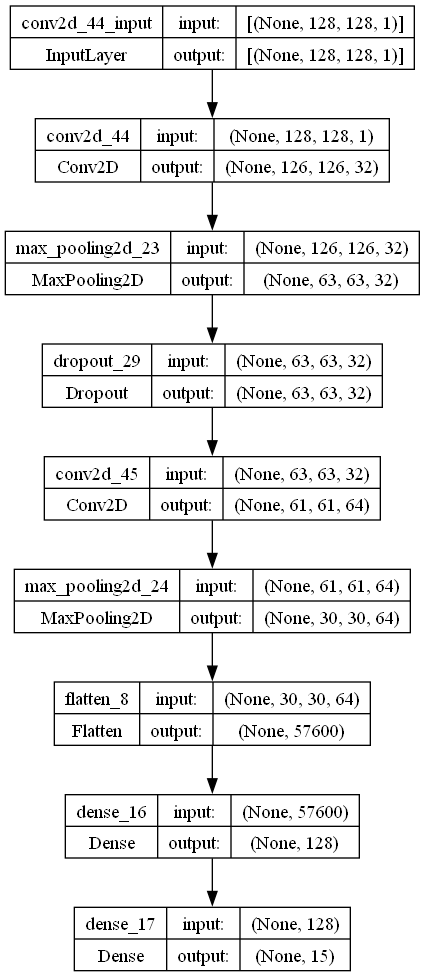

In [51]:
tf.keras.utils.plot_model(baseline_model_128_original, show_shapes=True)

Epoch 1/30


283/283 [==============================] - 4s 11ms/step - loss: 2.0959 - accuracy: 0.3423 - val_loss: 1.7173 - val_accuracy: 0.4763
Epoch 2/30
283/283 [==============================] - 3s 11ms/step - loss: 1.2845 - accuracy: 0.6071 - val_loss: 1.2348 - val_accuracy: 0.6210
Epoch 3/30
283/283 [==============================] - 3s 11ms/step - loss: 0.8065 - accuracy: 0.7543 - val_loss: 0.9968 - val_accuracy: 0.7003
Epoch 4/30
283/283 [==============================] - 3s 11ms/step - loss: 0.4663 - accuracy: 0.8605 - val_loss: 1.0424 - val_accuracy: 0.6977
Epoch 5/30
283/283 [==============================] - 3s 11ms/step - loss: 0.2595 - accuracy: 0.9278 - val_loss: 1.0282 - val_accuracy: 0.7363
Epoch 6/30
283/283 [==============================] - 3s 11ms/step - loss: 0.1444 - accuracy: 0.9596 - val_loss: 1.0539 - val_accuracy: 0.7283
Epoch 7/30
283/283 [==============================] - 3s 11ms/step - loss: 0.0726 - accuracy: 0.9815 - val_loss: 1.0097 - val_accuracy: 0.7693
Epoch 8/30

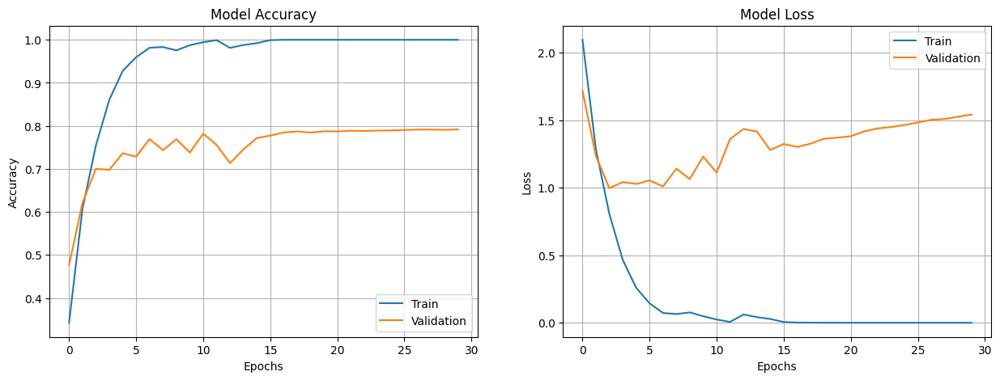

Loss on Test Dataset: 1.4051%
Accuracy on Test Dataset: 80.33%
CNN Error on Test Dataset: 19.67%


In [52]:
# Fit model with original train dataset
history_baseline_model_128_original = baseline_model_128_original.fit(train_ds_128_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# Save weights
baseline_model_128_original.save_weights('baseline_model_128_rescaled_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_baseline_model_128_original)

# Final evaluation of model
scores = baseline_model_128_original.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

<u>Insights for Accuracy:</u>

In the plots above, the training accuracy is increasing linearly over time, whereas validation accuracy stalls around 75% in the training process. 

There is a <u>big gap in accuracy between training and validation</u>, showing signs of <u>overfitting</u>. The model hence has a difficult time generalising on a new dataset.

As we have seen in the Exploratory Data Analysis, with a small number of training examples, the model sometimes learns from noises or unwanted details from training examples. This might have led to the negative impacts on the performance of the model on new examples.

<u>Insights for Loss:</u>

Simiarly, we see that the loss for train & validation starts to diverage & there is a big gap.

<h4><b><u>Rescaled & Data Augmentated Train Dataset</u></b></h4>

In [19]:
baseline_model_128_dataAug = Sequential()

# Convolutional Layer
baseline_model_128_dataAug.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Pooling layer
baseline_model_128_dataAug.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
baseline_model_128_dataAug.add(Dropout(0.2))
# Convolutional Layer
baseline_model_128_dataAug.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
baseline_model_128_dataAug.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the feature map
baseline_model_128_dataAug.add(Flatten())

# Fully connected layer
baseline_model_128_dataAug.add(Dense(128, activation='relu'))
baseline_model_128_dataAug.add(Dense(num_classes, activation='softmax'))

# Compile basedline_model_128
baseline_model_128_dataAug.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the basedline_model_128 summary
baseline_model_128_dataAug.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 63, 63, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 57600)            

Epoch 1/30
566/566 [==============================] - 12s 12ms/step - loss: 2.0684 - accuracy: 0.3405 - val_loss: 1.3736 - val_accuracy: 0.5873
Epoch 2/30
566/566 [==============================] - 7s 12ms/step - loss: 1.3127 - accuracy: 0.5881 - val_loss: 0.9857 - val_accuracy: 0.6883
Epoch 3/30
566/566 [==============================] - 7s 12ms/step - loss: 0.9742 - accuracy: 0.6938 - val_loss: 0.7624 - val_accuracy: 0.7697
Epoch 4/30
566/566 [==============================] - 7s 12ms/step - loss: 0.7857 - accuracy: 0.7537 - val_loss: 0.7085 - val_accuracy: 0.7990
Epoch 5/30
566/566 [==============================] - 7s 12ms/step - loss: 0.6881 - accuracy: 0.7882 - val_loss: 0.6580 - val_accuracy: 0.8160
Epoch 6/30
566/566 [==============================] - 7s 12ms/step - loss: 0.6122 - accuracy: 0.8117 - val_loss: 0.6141 - val_accuracy: 0.8243
Epoch 7/30
566/566 [==============================] - 7s 12ms/step - loss: 0.5363 - accuracy: 0.8355 - val_loss: 0.5442 - val_accuracy: 0.846

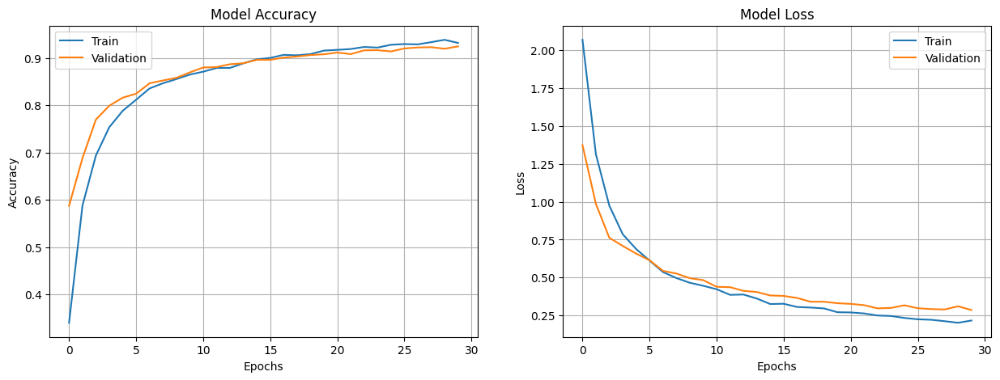

Loss on Test Dataset: 0.2692%
Accuracy on Test Dataset: 91.90%
CNN Error on Test Dataset: 8.10%


In [20]:
# Fit model with rescaled & data augmentated train dataset
history_baseline_model_128_dataAug = baseline_model_128_dataAug.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# save weights
baseline_model_128_dataAug.save_weights('baseline_model_128_dataAug_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_baseline_model_128_dataAug)

# Final evaluation of model
scores = baseline_model_128_dataAug.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Insights:

- Less overfitting with rescaled & data augmentated train dataset.
- The gap between the train & validation metrics is smaller for training with rescaled & data augmentated trian dataset.
- Test accuracy has improved as compared to using the original rescaled dataset.
- However, the trade off is that the train accuracy has decreased as compared to using the original rescaled dataset.

Hence, <u><b>data augmentation has proven to be beneficial</b></u> as it has improved the performance of the model by reducing overfitting by introducing more data to learn from to prevent generalization.

<h3><b><mark>B. Input size: 31 by 31 pixels</mark></b></h3>

<h4><b><u>Original Rescaled Train Dataset</u></b></h4>

In [55]:
baseline_model_31_original = Sequential()

# Convolutional Layer
baseline_model_31_original.add(Conv2D(32, (3,3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
baseline_model_31_original.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
baseline_model_31_original.add(Dropout(0.2))
# Convolutional Layer
baseline_model_31_original.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
baseline_model_31_original.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the feature map
baseline_model_31_original.add(Flatten())

# Fully connected layer
baseline_model_31_original.add(Dense(128, activation='relu'))
baseline_model_31_original.add(Dense(num_classes, activation='softmax'))

# Compile baseline_model_31_original
baseline_model_31_original.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the baseline_model_31_original summary
baseline_model_31_original.summary()

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_27 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_31 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_49 (Conv2D)          (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 flatten_10 (Flatten)        (None, 2304)            

Epoch 1/30


283/283 [==============================] - 2s 6ms/step - loss: 2.3446 - accuracy: 0.2335 - val_loss: 1.9836 - val_accuracy: 0.3817
Epoch 2/30
283/283 [==============================] - 2s 6ms/step - loss: 1.6670 - accuracy: 0.4670 - val_loss: 1.6116 - val_accuracy: 0.4783
Epoch 3/30
283/283 [==============================] - 2s 6ms/step - loss: 1.3370 - accuracy: 0.5712 - val_loss: 1.3778 - val_accuracy: 0.5643
Epoch 4/30
283/283 [==============================] - 2s 6ms/step - loss: 1.1002 - accuracy: 0.6485 - val_loss: 1.2225 - val_accuracy: 0.5947
Epoch 5/30
283/283 [==============================] - 2s 6ms/step - loss: 0.9229 - accuracy: 0.7079 - val_loss: 0.9688 - val_accuracy: 0.6857
Epoch 6/30
283/283 [==============================] - 2s 6ms/step - loss: 0.8048 - accuracy: 0.7509 - val_loss: 0.9234 - val_accuracy: 0.7050
Epoch 7/30
283/283 [==============================] - 3s 11ms/step - loss: 0.6806 - accuracy: 0.7915 - val_loss: 0.9027 - val_accuracy: 0.7270
Epoch 8/30
283/2

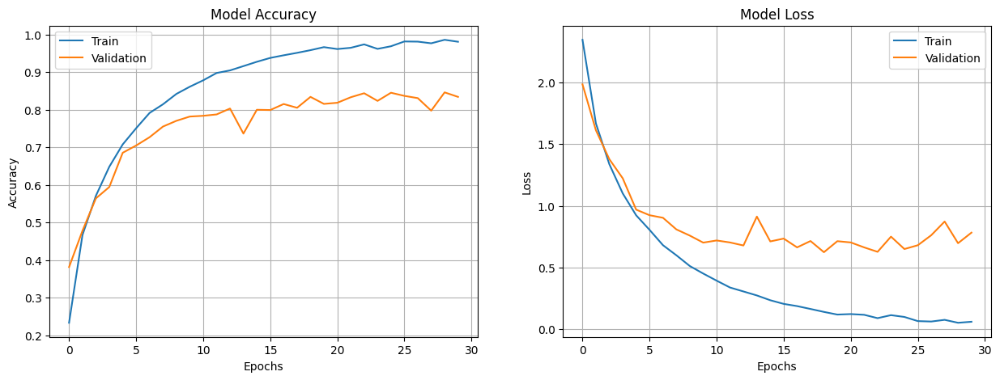

Loss on Test Dataset: 0.7183%
Accuracy on Test Dataset: 84.53%
CNN Error on Test Dataset: 15.47%


In [56]:
# Fit model with original train dataset
history_basedline_model_31_original = baseline_model_31_original.fit(train_ds_31_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# save weights
baseline_model_31_original.save_weights('baseline_model_31_rescaled_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_basedline_model_31_original)

# Final evaluation of model
scores = baseline_model_31_original.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

<h4><b><u>Rescaled & Data Augmentated Train Dataset</u></b></h4>

In [57]:
baseline_model_31_dataAug = Sequential()

# Convolutional Layer
baseline_model_31_dataAug.add(Conv2D(32, (3,3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
baseline_model_31_dataAug.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
baseline_model_31_dataAug.add(Dropout(0.2))
# Convolutional Layer
baseline_model_31_dataAug.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
baseline_model_31_dataAug.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the feature map
baseline_model_31_dataAug.add(Flatten())

# Fully connected layer
baseline_model_31_dataAug.add(Dense(128, activation='relu'))
baseline_model_31_dataAug.add(Dense(num_classes, activation='softmax'))

# Compile baseline_model_31_dataAug
baseline_model_31_dataAug.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the baseline_model_31_dataAug summary
baseline_model_31_dataAug.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_50 (Conv2D)          (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_29 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_32 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_51 (Conv2D)          (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_30 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 flatten_11 (Flatten)        (None, 2304)            

Epoch 1/30
566/566 [==============================] - 4s 7ms/step - loss: 2.2004 - accuracy: 0.2873 - val_loss: 1.7515 - val_accuracy: 0.4263
Epoch 2/30
566/566 [==============================] - 4s 7ms/step - loss: 1.7217 - accuracy: 0.4421 - val_loss: 1.3903 - val_accuracy: 0.5513
Epoch 3/30
566/566 [==============================] - 4s 7ms/step - loss: 1.4917 - accuracy: 0.5178 - val_loss: 1.1122 - val_accuracy: 0.6280
Epoch 4/30
566/566 [==============================] - 4s 7ms/step - loss: 1.3155 - accuracy: 0.5714 - val_loss: 0.9217 - val_accuracy: 0.7077
Epoch 5/30
566/566 [==============================] - 4s 7ms/step - loss: 1.1978 - accuracy: 0.6182 - val_loss: 0.9351 - val_accuracy: 0.6910
Epoch 6/30
566/566 [==============================] - 4s 7ms/step - loss: 1.0979 - accuracy: 0.6483 - val_loss: 0.7806 - val_accuracy: 0.7547
Epoch 7/30
566/566 [==============================] - 4s 8ms/step - loss: 1.0193 - accuracy: 0.6763 - val_loss: 0.7221 - val_accuracy: 0.7750
Epoch 

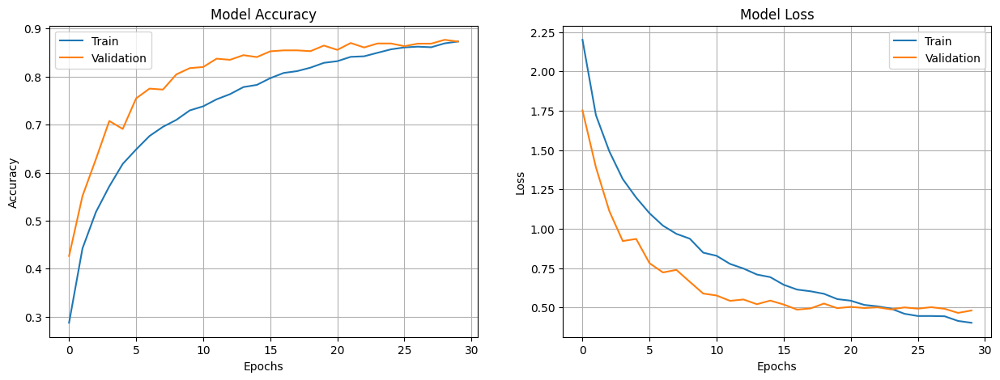

Loss on Test Dataset: 0.3994%
Accuracy on Test Dataset: 89.13%
CNN Error on Test Dataset: 10.87%


In [58]:
# Fit model with original train dataset
history_baseline_model_31_dataAug = baseline_model_31_dataAug.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# save weights
baseline_model_31_dataAug.save_weights('baseline_model_31_dataAug_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_baseline_model_31_dataAug)

# Final evaluation of model
scores = baseline_model_31_dataAug.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Insights:

- Less overfitting with rescaled & data augmentated train dataset.
- The gap between the train & validation metrics is smaller for training with rescaled & data augmentated trian dataset.
- Test accuracy has improved as compared to using the original rescaled dataset.
- Train accuracy has decreased as compared to using the original rescaled dataset.

Hence, <u><b>data augmentation has proven to be beneficial</b></u> for 31x31 input size as it has improved the performance of the model by reducing overfitting by introducing more data to learn from to prevent generalization.

<hr>
<h3><b>More Complex CNN Model</b></h3>

Larger CNN architecture with additional convolutional, max pooling, dropout, batch normalization layers and fully connected layers with more neurons.

As seen above, I will work towards improving both the train and test accuracies while reducing overfitting.

<h3><b><mark>A. Input size: 128 by 128 pixels</mark></b></h3>

1. First off, I will start by <u>increasing Dropout form 0.2 to 0.4.</u>

In [59]:
complex_model_128_dropOut = Sequential()

# Convolutional Layer
complex_model_128_dropOut.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Pooling layer
complex_model_128_dropOut.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_dropOut.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_dropOut.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_128_dropOut.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the feature map
complex_model_128_dropOut.add(Flatten())

# Fully connected layer
complex_model_128_dropOut.add(Dense(128, activation='relu'))
complex_model_128_dropOut.add(Dense(num_classes, activation='softmax'))

# Compile basedline_model_128
complex_model_128_dropOut.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the basedline_model_128 summary
complex_model_128_dropOut.summary()

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_52 (Conv2D)          (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_31 (MaxPoolin  (None, 63, 63, 32)       0         
 g2D)                                                            
                                                                 
 dropout_33 (Dropout)        (None, 63, 63, 32)        0         
                                                                 
 conv2d_53 (Conv2D)          (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_32 (MaxPoolin  (None, 30, 30, 64)       0         
 g2D)                                                            
                                                                 
 flatten_12 (Flatten)        (None, 57600)           

Epoch 1/30
566/566 [==============================] - 8s 12ms/step - loss: 2.2090 - accuracy: 0.3037 - val_loss: 1.4984 - val_accuracy: 0.5653
Epoch 2/30
566/566 [==============================] - 7s 13ms/step - loss: 1.3787 - accuracy: 0.5640 - val_loss: 0.9402 - val_accuracy: 0.7140
Epoch 3/30
566/566 [==============================] - 8s 13ms/step - loss: 1.0277 - accuracy: 0.6787 - val_loss: 0.7504 - val_accuracy: 0.7757
Epoch 4/30
566/566 [==============================] - 8s 14ms/step - loss: 0.8249 - accuracy: 0.7423 - val_loss: 0.6618 - val_accuracy: 0.8093
Epoch 5/30
566/566 [==============================] - 7s 13ms/step - loss: 0.6989 - accuracy: 0.7814 - val_loss: 0.6205 - val_accuracy: 0.8233
Epoch 6/30
566/566 [==============================] - 7s 12ms/step - loss: 0.6195 - accuracy: 0.8085 - val_loss: 0.5750 - val_accuracy: 0.8357
Epoch 7/30
566/566 [==============================] - 7s 13ms/step - loss: 0.5903 - accuracy: 0.8215 - val_loss: 0.4916 - val_accuracy: 0.8580

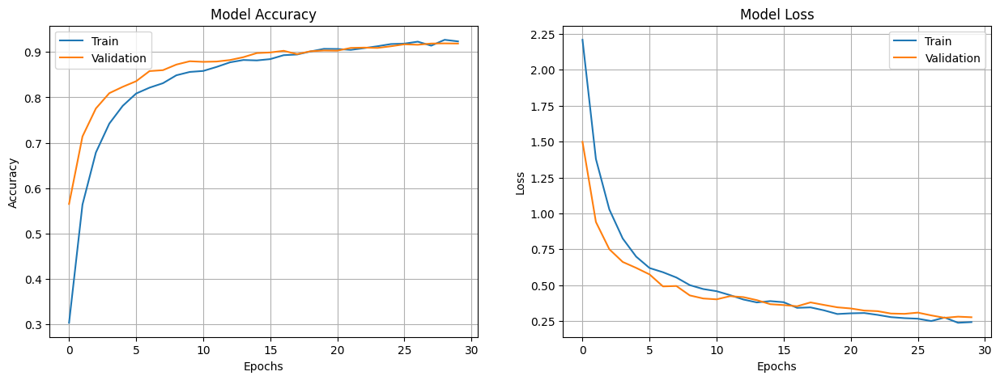

Loss on Test Dataset: 0.2564%
Accuracy on Test Dataset: 92.13%
CNN Error on Test Dataset: 7.87%


In [60]:
# Fit model with rescaled & data augmentated train dataset
history_complex_model_128_dropOut = complex_model_128_dropOut.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# save weights
complex_model_128_dropOut.save_weights('complex_model_128_dropOut_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_128_dropOut)

# Final evaluation of model
scores = complex_model_128_dropOut.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

<u>Insights:</u>

Even though there is a minimum difference, we can tell that the dropout layer helps to reduce overfitting by a little bit, as the gap between the train and validation is slightly smaller.

The test accuray has increased while the train accuracy has decreased. 

2. Now, I am going to add one more convolutional layer with more neurons and <u>add dropout layers</u> after each convolutional and dense layer. I will also be adding in one <u>BatchNormalization layer</u>.

I have chosen to set the number of filters to be increasing per Conv2D layer.

This is because the input the model receives is the raw pixel data, which is noisy, hence I will let the CNN first extract some relevant information from the noisy, "dirty" raw pixel data. 

Once the useful features have been extracted, I will then make the CNN elaborate more complex abstractions on it.

Hence, as the network gets deeper, the number of filters increases.

Source: https://datascience.stackexchange.com/questions/55545/in-cnn-why-do-we-increase-the-number-of-filters-in-deeper-convolution-layers-fo

In [16]:
complex_model_128_2 = Sequential()

# Convolutional Layer
complex_model_128_2.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Pooling layer
complex_model_128_2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_2.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_2.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_128_2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_2.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_2.add(Conv2D(128, (3,3), activation='relu'))
# Pooling layer
complex_model_128_2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_2.add(Dropout(0.4))

# Flatten the feature map
complex_model_128_2.add(Flatten())

# Fully connected layer
complex_model_128_2.add(Dense(128, activation='relu'))
# Batch Normalization layer
complex_model_128_2.add(BatchNormalization())
# Dropout layer
complex_model_128_2.add(Dropout(0.4))
# Outout layer
complex_model_128_2.add(Dense(num_classes, activation='softmax'))

# Compile basedline_model_128
complex_model_128_2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the basedline_model_128 summary
complex_model_128_2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 63, 63, 32)       0         
 2D)                                                             
                                                                 
 dropout_1 (Dropout)         (None, 63, 63, 32)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 dropout_2 (Dropout)         (None, 30, 30, 64)       

Epoch 1/30
566/566 [==============================] - 12s 19ms/step - loss: 2.2059 - accuracy: 0.2933 - val_loss: 3.3519 - val_accuracy: 0.1073
Epoch 2/30
566/566 [==============================] - 8s 14ms/step - loss: 1.5971 - accuracy: 0.4843 - val_loss: 3.3179 - val_accuracy: 0.1833
Epoch 3/30
566/566 [==============================] - 8s 13ms/step - loss: 1.3436 - accuracy: 0.5652 - val_loss: 1.6356 - val_accuracy: 0.4847
Epoch 4/30
566/566 [==============================] - 7s 13ms/step - loss: 1.1794 - accuracy: 0.6272 - val_loss: 2.0793 - val_accuracy: 0.3727
Epoch 5/30
566/566 [==============================] - 7s 13ms/step - loss: 0.9997 - accuracy: 0.6854 - val_loss: 1.1398 - val_accuracy: 0.6553
Epoch 6/30
566/566 [==============================] - 7s 13ms/step - loss: 0.8999 - accuracy: 0.7185 - val_loss: 1.1622 - val_accuracy: 0.6100
Epoch 7/30
566/566 [==============================] - 7s 13ms/step - loss: 0.7996 - accuracy: 0.7500 - val_loss: 1.3758 - val_accuracy: 0.573

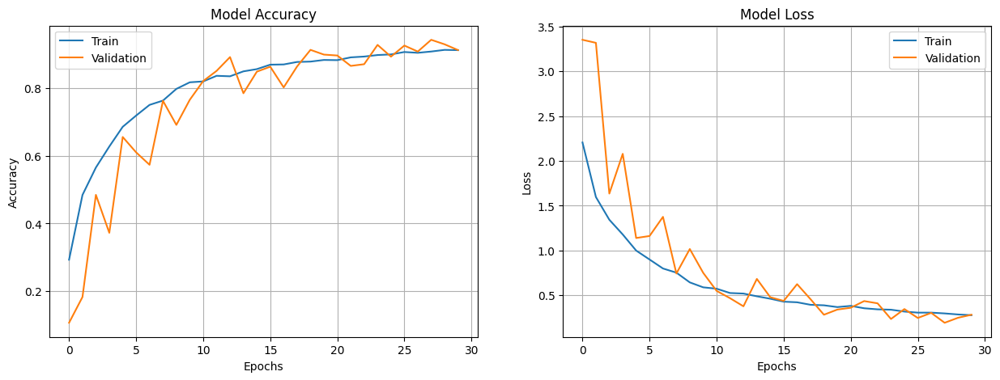

Loss on Test Dataset: 0.2656%
Accuracy on Test Dataset: 91.40%
CNN Error on Test Dataset: 8.60%


In [17]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_128_2 = complex_model_128_2.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_128_2.save_weights('complex_model_128_2_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_128_2)

# Final evaluation of model
scores = complex_model_128_2.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

3. Next, I am going to make the model even more complex by adding back to back Conv2D layers.

I have taken inspiration from the the architecture of the VGG16 model. I have adjust the architecture to suit my avaiable resources and the dataset.

<img src='https://miro.medium.com/v2/resize:fit:827/1*UeAhoKM0kJfCPA03wt5H0A.png'>

In [18]:
complex_model_128_3 = Sequential()

# Convolutional Layer
complex_model_128_3.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Convolutional Layer
complex_model_128_3.add(Conv2D(32, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3.add(Conv2D(64, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3.add(Conv2D(128, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3.add(Conv2D(128, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3.add(Dropout(0.4))

# Flatten the feature map
complex_model_128_3.add(Flatten())

# Fully connected layer
complex_model_128_3.add(Dense(128, activation='relu'))
# Batch Normalization layer
complex_model_128_3.add(BatchNormalization())
# Dropout layer
complex_model_128_3.add(Dropout(0.4))
# Outout layer
complex_model_128_3.add(Dense(num_classes, activation='softmax'))

# Compile basedline_model_128
complex_model_128_3.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the basedline_model_128 summary
complex_model_128_3.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 126, 126, 32)      320       
                                                                 
 conv2d_6 (Conv2D)           (None, 124, 124, 32)      9248      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                             
                                                                 
 dropout_5 (Dropout)         (None, 62, 62, 32)        0         
                                                                 
 conv2d_7 (Conv2D)           (None, 60, 60, 64)        18496     
                                                                 
 conv2d_8 (Conv2D)           (None, 58, 58, 64)        36928     
                                                      

Epoch 1/30
566/566 [==============================] - 35s 57ms/step - loss: 2.3749 - accuracy: 0.2401 - val_loss: 2.7497 - val_accuracy: 0.1683
Epoch 2/30
566/566 [==============================] - 31s 55ms/step - loss: 1.9504 - accuracy: 0.3744 - val_loss: 2.5912 - val_accuracy: 0.2793
Epoch 3/30
566/566 [==============================] - 30s 53ms/step - loss: 1.5189 - accuracy: 0.5158 - val_loss: 1.1851 - val_accuracy: 0.6123
Epoch 4/30
566/566 [==============================] - 13s 23ms/step - loss: 1.2033 - accuracy: 0.6171 - val_loss: 1.0343 - val_accuracy: 0.6600
Epoch 5/30
566/566 [==============================] - 12s 21ms/step - loss: 1.1116 - accuracy: 0.6375 - val_loss: 0.9513 - val_accuracy: 0.6923
Epoch 6/30
566/566 [==============================] - 12s 21ms/step - loss: 0.8952 - accuracy: 0.7142 - val_loss: 0.9308 - val_accuracy: 0.6930
Epoch 7/30
566/566 [==============================] - 12s 22ms/step - loss: 0.8056 - accuracy: 0.7458 - val_loss: 0.9341 - val_accuracy:

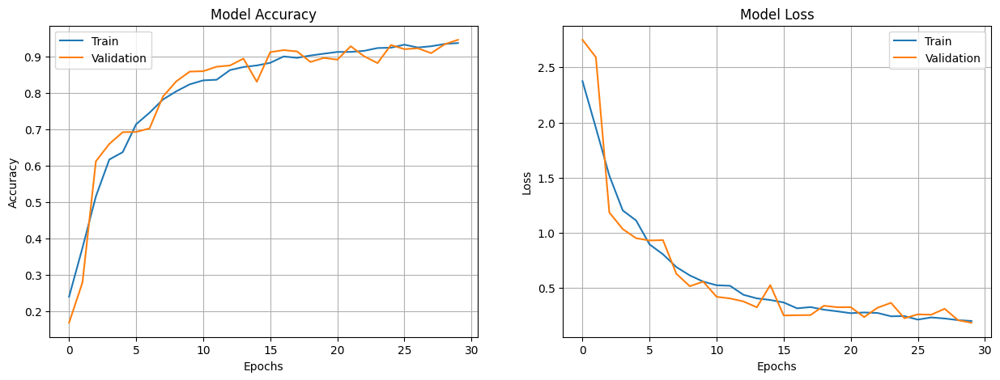

Loss on Test Dataset: 0.2089%
Accuracy on Test Dataset: 94.37%
CNN Error on Test Dataset: 5.63%


In [19]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_128_3 = complex_model_128_3.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_128_3.save_weights('complex_model_128_3_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_128_3)

# Final evaluation of model
scores = complex_model_128_3.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Insights:

- After adding back to back Conv2D layers, the model appears to be more stable.
- The test accuracy has also increased.

<b><U>I will select this complex model as my best model for the 128 x 128 input size model.</U></b>

<h3><b><mark>B. Input size: 31 by 31 pixels</mark></b></h3>

1. Similarly, I will investigate if increasing the dropout size benefits the model.

In [61]:
complex_model_31_dropOut = Sequential()

# Convolutional Layer
complex_model_31_dropOut.add(Conv2D(32, (3,3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
complex_model_31_dropOut.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_dropOut.add(Dropout(0.4))
# Convolutional Layer
complex_model_31_dropOut.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_31_dropOut.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the feature map
complex_model_31_dropOut.add(Flatten())

# Fully connected layer
complex_model_31_dropOut.add(Dense(128, activation='relu'))
complex_model_31_dropOut.add(Dense(num_classes, activation='softmax'))

# Compile complex_model_31_dropOut
complex_model_31_dropOut.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the complex_model_31_dropOut summary
complex_model_31_dropOut.summary()

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_54 (Conv2D)          (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_33 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_34 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_55 (Conv2D)          (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 flatten_13 (Flatten)        (None, 2304)            

Epoch 1/30
566/566 [==============================] - 4s 7ms/step - loss: 2.2391 - accuracy: 0.2743 - val_loss: 1.7968 - val_accuracy: 0.4267
Epoch 2/30
566/566 [==============================] - 4s 8ms/step - loss: 1.7393 - accuracy: 0.4361 - val_loss: 1.3075 - val_accuracy: 0.5803
Epoch 3/30
566/566 [==============================] - 4s 7ms/step - loss: 1.4565 - accuracy: 0.5305 - val_loss: 1.0431 - val_accuracy: 0.6810
Epoch 4/30
566/566 [==============================] - 4s 7ms/step - loss: 1.2941 - accuracy: 0.5858 - val_loss: 0.9232 - val_accuracy: 0.7083
Epoch 5/30
566/566 [==============================] - 4s 7ms/step - loss: 1.1802 - accuracy: 0.6228 - val_loss: 0.8389 - val_accuracy: 0.7410
Epoch 6/30
566/566 [==============================] - 4s 7ms/step - loss: 1.0929 - accuracy: 0.6470 - val_loss: 0.7679 - val_accuracy: 0.7633
Epoch 7/30
566/566 [==============================] - 4s 7ms/step - loss: 1.0130 - accuracy: 0.6740 - val_loss: 0.6973 - val_accuracy: 0.7797
Epoch 

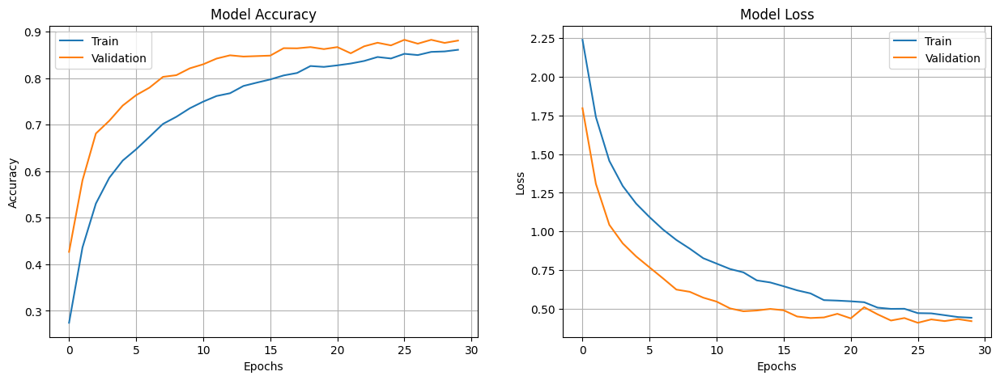

Loss on Test Dataset: 0.3994%
Accuracy on Test Dataset: 89.43%
CNN Error on Test Dataset: 10.57%


In [62]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_31_dropOut = complex_model_31_dropOut.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_31_dropOut.save_weights('complex_model_31_dropOut_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_31_dropOut)

# Final evaluation of model
scores = complex_model_31_dropOut.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Increasing the dropout from 0.2 to 0.4 does slighlty improve the performance of the model.

2. Now, I am going to add one more convolutional layer with more neurons and <u>add dropout layers</u> after each convolutional and dense layer. I will also be adding in one <u>BatchNormalization layer</u>.

In [16]:
complex_model_31_2 = Sequential()

# Convolutional Layer
complex_model_31_2.add(Conv2D(32, (3,3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
complex_model_31_2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_2.add(Dropout(0.2))
# Convolutional Layer
complex_model_31_2.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_31_2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_2.add(Dropout(0.3))
# Convolutional Layer
complex_model_31_2.add(Conv2D(128, (3,3), activation='relu'))
# Pooling layer
complex_model_31_2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_2.add(Dropout(0.2))

# Flatten the feature map
complex_model_31_2.add(Flatten())

# Fully connected layer
complex_model_31_2.add(Dense(128, activation='relu'))
# Batch Normalization layer
complex_model_31_2.add(BatchNormalization())
# Dropout layer
complex_model_31_2.add(Dropout(0.2))
# Output layer
complex_model_31_2.add(Dense(num_classes, activation='softmax'))

# Compile complex_model_31_2
complex_model_31_2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the complex_model_31_2 summary
complex_model_31_2.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 dropout_3 (Dropout)         (None, 14, 14, 32)        0         
                                                                 
 conv2d_3 (Conv2D)           (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 dropout_4 (Dropout)         (None, 6, 6, 64)         

Epoch 1/30
566/566 [==============================] - 8s 12ms/step - loss: 2.1889 - accuracy: 0.2921 - val_loss: 1.8665 - val_accuracy: 0.4590
Epoch 2/30
566/566 [==============================] - 7s 12ms/step - loss: 1.7751 - accuracy: 0.4182 - val_loss: 1.3743 - val_accuracy: 0.5563
Epoch 3/30
566/566 [==============================] - 7s 12ms/step - loss: 1.5469 - accuracy: 0.4930 - val_loss: 1.1487 - val_accuracy: 0.6267
Epoch 4/30
566/566 [==============================] - 6s 11ms/step - loss: 1.3922 - accuracy: 0.5460 - val_loss: 0.9465 - val_accuracy: 0.6883
Epoch 5/30
566/566 [==============================] - 6s 11ms/step - loss: 1.3029 - accuracy: 0.5828 - val_loss: 0.7717 - val_accuracy: 0.7637
Epoch 6/30
566/566 [==============================] - 7s 12ms/step - loss: 1.2067 - accuracy: 0.6086 - val_loss: 0.7078 - val_accuracy: 0.7687
Epoch 7/30
566/566 [==============================] - 6s 11ms/step - loss: 1.1340 - accuracy: 0.6319 - val_loss: 0.6889 - val_accuracy: 0.7760

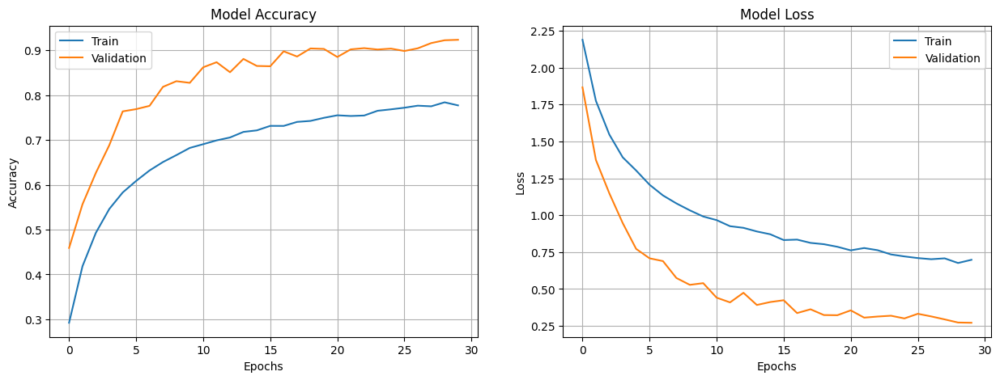

Loss on Test Dataset: 0.2784%
Accuracy on Test Dataset: 91.77%
CNN Error on Test Dataset: 8.23%


In [17]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_31_2 = complex_model_31_2.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_31_2.save_weights('complex_model_31_2_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_31_2)

# Final evaluation of model
scores = complex_model_31_2.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

The test accuracy has increased but there is stronger overfitting.

In [14]:
# Create model
complex_model_31_3 = Sequential()

# Input layer
complex_model_31_3.add(Conv2D(32, (3, 3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
complex_model_31_3.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_3.add(Dropout(0.2))
# Convolutional layer
complex_model_31_3.add(Conv2D(64, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3.add(MaxPooling2D(pool_size=(2, 2)))
# Batch Normalization
complex_model_31_3.add(BatchNormalization())
# Dropout layer
complex_model_31_3.add(Dropout(0.3))
# Convolutional layer
complex_model_31_3.add(Conv2D(128, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout Layer
complex_model_31_3.add(Dropout(0.2))

# Flatten Feature Map
complex_model_31_3.add(Flatten())

# Fully Connected Dense Layer
complex_model_31_3.add(Dense(128, activation='relu'))
# Batch Normalization
complex_model_31_3.add(BatchNormalization())
# Dropout layer
complex_model_31_3.add(Dropout(0.2))
# Fully Connected Dense Layer
complex_model_31_3.add(Dense(64, activation='relu'))
# Output layer
complex_model_31_3.add(Dense(num_classes, activation='softmax'))

# Compile complex_model_31_3
complex_model_31_3.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# complex_model_31_3 summary
complex_model_31_3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 14, 14, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 64)         0         
 2D)                                                             
                                                                 
 batch_normalization (BatchN  (None, 6, 6, 64)        

Epoch 1/30
566/566 [==============================] - 14s 13ms/step - loss: 2.1791 - accuracy: 0.2899 - val_loss: 2.9717 - val_accuracy: 0.2157
Epoch 2/30
566/566 [==============================] - 7s 13ms/step - loss: 1.6849 - accuracy: 0.4472 - val_loss: 1.3918 - val_accuracy: 0.5373
Epoch 3/30
566/566 [==============================] - 7s 13ms/step - loss: 1.4844 - accuracy: 0.5119 - val_loss: 1.2422 - val_accuracy: 0.5883
Epoch 4/30
566/566 [==============================] - 7s 13ms/step - loss: 1.3344 - accuracy: 0.5643 - val_loss: 0.9604 - val_accuracy: 0.6837
Epoch 5/30
566/566 [==============================] - 7s 13ms/step - loss: 1.2280 - accuracy: 0.5969 - val_loss: 0.8229 - val_accuracy: 0.7273
Epoch 6/30
566/566 [==============================] - 7s 13ms/step - loss: 1.1329 - accuracy: 0.6314 - val_loss: 0.7799 - val_accuracy: 0.7477
Epoch 7/30
566/566 [==============================] - 8s 13ms/step - loss: 1.0651 - accuracy: 0.6561 - val_loss: 0.5901 - val_accuracy: 0.815

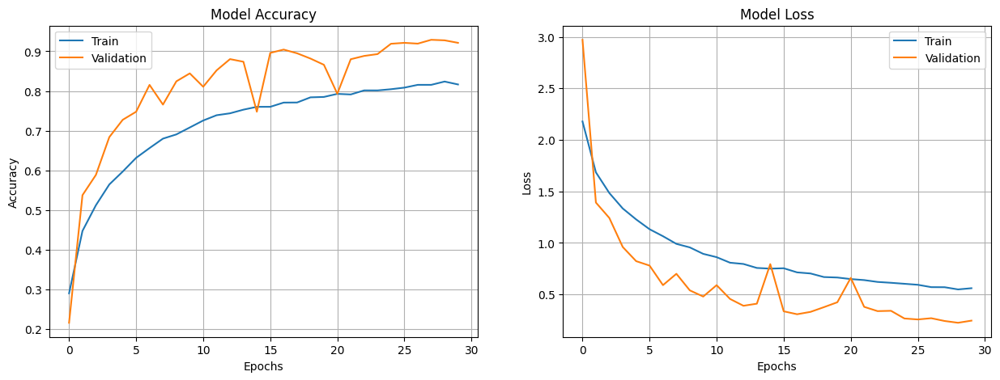

Loss on Test Dataset: 0.2409%
Accuracy on Test Dataset: 92.10%
CNN Error on Test Dataset: 7.90%


In [15]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_31_3 = complex_model_31_3.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_31_3.save_weights('complex_model_31_3_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_31_3)

# Final evaluation of model
scores = complex_model_31_3.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Insights:

As I did modelling for the input size 31 x 31, I realised that the model tends to overfit more than for input size 128 x 128.

<hr>
<h2><mark>5. Model Improvement</mark></h2>

<h3>1. Layer Kernel Regularizers</h3>

Regularizers allow you to apply penalties on layer parameters or layer activity during optimization. These penalties are summed into the loss function that the network optimizes.

I will be applying the kernel_regularizer to penalize the weights which are very large causing the network to overfit.


The available regularizers are L1 class & L2 class. The difference between the two is in how they are calculated.

L1 regularization penalty: loss = l1 * reduce_sum(abs(x))

L2 regularization penalty: loss = l2 * reduce_sum(square(x))

Source: <br>
https://keras.io/api/layers/regularizers/<br>
https://www.tensorflow.org/api_docs/python/tf/keras/regularizers<br>
https://www.analyticsvidhya.com/blog/2018/04/fundamentals-deep-learning-regularization-techniques/

<h3><b><mark>A. Input size: 128 by 128 pixels</mark></b></h3>

<b><u>1. L1 regularization</u></b>

In [95]:
complex_model_128_3_l1 = Sequential()

# Convolutional Layer
complex_model_128_3_l1.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Convolutional Layer
complex_model_128_3_l1.add(Conv2D(32, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l1.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l1.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l1.add(Conv2D(64, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l1.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l1.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l1.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l1.add(Conv2D(128, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l1.add(Conv2D(128, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l1.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l1.add(Dropout(0.4))

# Flatten the feature map
complex_model_128_3_l1.add(Flatten())

# Fully connected layer
complex_model_128_3_l1.add(Dense(128, activation='relu'))
# Batch Normalization layer
complex_model_128_3_l1.add(BatchNormalization())
# Dropout layer
complex_model_128_3_l1.add(Dropout(0.4))
# Outout layer
complex_model_128_3_l1.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l1(0.01)))

# Compile basedline_model_128
complex_model_128_3_l1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the basedline_model_128 summary
complex_model_128_3_l1.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_92 (Conv2D)          (None, 126, 126, 32)      320       
                                                                 
 conv2d_93 (Conv2D)          (None, 124, 124, 32)      9248      
                                                                 
 max_pooling2d_65 (MaxPoolin  (None, 62, 62, 32)       0         
 g2D)                                                            
                                                                 
 dropout_69 (Dropout)        (None, 62, 62, 32)        0         
                                                                 
 conv2d_94 (Conv2D)          (None, 60, 60, 64)        18496     
                                                                 
 conv2d_95 (Conv2D)          (None, 58, 58, 64)        36928     
                                                     

Epoch 1/30
566/566 [==============================] - 38s 67ms/step - loss: 2.9554 - accuracy: 0.2234 - val_loss: 2.4250 - val_accuracy: 0.2603
Epoch 2/30
566/566 [==============================] - 38s 66ms/step - loss: 2.1265 - accuracy: 0.3759 - val_loss: 2.2518 - val_accuracy: 0.3170
Epoch 3/30
566/566 [==============================] - 37s 65ms/step - loss: 1.8380 - accuracy: 0.4925 - val_loss: 1.8126 - val_accuracy: 0.5160
Epoch 4/30
566/566 [==============================] - 38s 66ms/step - loss: 1.6792 - accuracy: 0.5488 - val_loss: 1.4784 - val_accuracy: 0.6370
Epoch 5/30
566/566 [==============================] - 38s 67ms/step - loss: 1.4476 - accuracy: 0.6268 - val_loss: 1.8600 - val_accuracy: 0.4607
Epoch 6/30
566/566 [==============================] - 38s 67ms/step - loss: 1.3080 - accuracy: 0.6751 - val_loss: 1.0876 - val_accuracy: 0.7653
Epoch 7/30
566/566 [==============================] - 37s 65ms/step - loss: 1.1425 - accuracy: 0.7295 - val_loss: 0.8673 - val_accuracy:

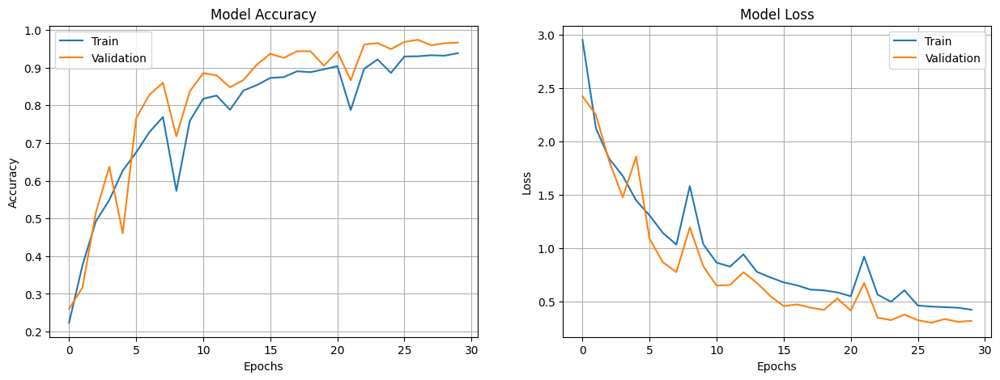

Loss on Test Dataset: 0.3160%
Accuracy on Test Dataset: 96.67%
CNN Error on Test Dataset: 3.33%


In [96]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_128_3_l1 = complex_model_128_3_l1.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_128_3_l1.save_weights('complex_model_128_3_l1_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_128_3_l1)

# Final evaluation of model
scores = complex_model_128_3_l1.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Insights:
- By adding in L1 regularisers, the model is less overfitted.

<b><u>2. L2 regularization</u></b>

In [99]:
complex_model_128_3_l2 = Sequential()

# Convolutional Layer
complex_model_128_3_l2.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2.add(Conv2D(32, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l2.add(Conv2D(64, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l2.add(Conv2D(128, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2.add(Conv2D(128, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2.add(Dropout(0.4))

# Flatten the feature map
complex_model_128_3_l2.add(Flatten())

# Fully connected layer
complex_model_128_3_l2.add(Dense(128, activation='relu'))
# Batch Normalization layer
complex_model_128_3_l2.add(BatchNormalization())
# Dropout layer
complex_model_128_3_l2.add(Dropout(0.4))
# Outout layer
complex_model_128_3_l2.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(0.01)))

# Compile basedline_model_128
complex_model_128_3_l2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# print the basedline_model_128 summary
complex_model_128_3_l2.summary()

Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_98 (Conv2D)          (None, 126, 126, 32)      320       
                                                                 
 conv2d_99 (Conv2D)          (None, 124, 124, 32)      9248      
                                                                 
 max_pooling2d_68 (MaxPoolin  (None, 62, 62, 32)       0         
 g2D)                                                            
                                                                 
 dropout_73 (Dropout)        (None, 62, 62, 32)        0         
                                                                 
 conv2d_100 (Conv2D)         (None, 60, 60, 64)        18496     
                                                                 
 conv2d_101 (Conv2D)         (None, 58, 58, 64)        36928     
                                                     

Epoch 1/30
566/566 [==============================] - 34s 59ms/step - loss: 2.4532 - accuracy: 0.2341 - val_loss: 2.1542 - val_accuracy: 0.2917
Epoch 2/30
566/566 [==============================] - 34s 59ms/step - loss: 1.8221 - accuracy: 0.4248 - val_loss: 2.5700 - val_accuracy: 0.2130
Epoch 3/30
566/566 [==============================] - 34s 59ms/step - loss: 1.5534 - accuracy: 0.5161 - val_loss: 1.6362 - val_accuracy: 0.4533
Epoch 4/30
566/566 [==============================] - 32s 56ms/step - loss: 1.2836 - accuracy: 0.6120 - val_loss: 0.9652 - val_accuracy: 0.7353
Epoch 5/30
566/566 [==============================] - 34s 59ms/step - loss: 1.1120 - accuracy: 0.6668 - val_loss: 1.0940 - val_accuracy: 0.6570
Epoch 6/30
566/566 [==============================] - 34s 59ms/step - loss: 0.9866 - accuracy: 0.7127 - val_loss: 0.8626 - val_accuracy: 0.7433
Epoch 7/30
566/566 [==============================] - 34s 59ms/step - loss: 0.9248 - accuracy: 0.7328 - val_loss: 0.6962 - val_accuracy:

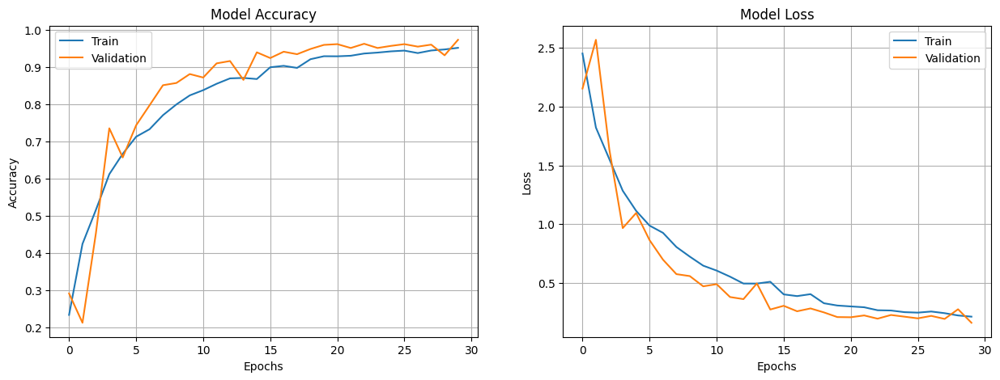

Loss on Test Dataset: 0.1422%
Accuracy on Test Dataset: 97.30%
CNN Error on Test Dataset: 2.70%


In [100]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_128_3_l2 = complex_model_128_3_l2.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_128_3_l2.save_weights('complex_model_128_3_l2_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_128_3_l2)

# Final evaluation of model
scores = complex_model_128_3_l2.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Insights:
- Model is less overfitted and test accuracy has increased.

Hence, I will choose L2 regularizer.

<h3><b><mark>B. Input size: 31 by 31 pixels</mark></b></h3>

<b><u>1. L1 regularization</u></b>

In [127]:
# Create model
complex_model_31_3_l1 = Sequential()

# Input layer
complex_model_31_3_l1.add(Conv2D(32, (3, 3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
complex_model_31_3_l1.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_3_l1.add(Dropout(0.2))
# Convolutional layer
complex_model_31_3_l1.add(Conv2D(64, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l1.add(MaxPooling2D(pool_size=(2, 2)))
# Batch Normalization
complex_model_31_3_l1.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l1.add(Dropout(0.3))
# Convolutional layer
complex_model_31_3_l1.add(Conv2D(128, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l1.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout Layer
complex_model_31_3_l1.add(Dropout(0.2))

# Flatten Feature Map
complex_model_31_3_l1.add(Flatten())

# Fully Connected Dense Layer
complex_model_31_3_l1.add(Dense(128, activation='relu'))
# Batch Normalization
complex_model_31_3_l1.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l1.add(Dropout(0.2))
# Fully Connected Dense Layer
complex_model_31_3_l1.add(Dense(64, activation='relu'))
# Output layer
complex_model_31_3_l1.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l1(0.01)))

# Compile complex_model_31_3_l1
complex_model_31_3_l1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# complex_model_31_3_l1 summary
complex_model_31_3_l1.summary()

Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_107 (Conv2D)         (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_74 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_81 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_108 (Conv2D)         (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_75 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 batch_normalization_28 (Bat  (None, 6, 6, 64)       

Epoch 1/30
566/566 [==============================] - 10s 16ms/step - loss: 2.9332 - accuracy: 0.2918 - val_loss: 3.3141 - val_accuracy: 0.1567
Epoch 2/30
566/566 [==============================] - 9s 16ms/step - loss: 2.1039 - accuracy: 0.3980 - val_loss: 2.2038 - val_accuracy: 0.3590
Epoch 3/30
566/566 [==============================] - 9s 16ms/step - loss: 1.8451 - accuracy: 0.4581 - val_loss: 1.9010 - val_accuracy: 0.4300
Epoch 4/30
566/566 [==============================] - 9s 16ms/step - loss: 1.7012 - accuracy: 0.5045 - val_loss: 1.5159 - val_accuracy: 0.5573
Epoch 5/30
566/566 [==============================] - 9s 15ms/step - loss: 1.5915 - accuracy: 0.5349 - val_loss: 1.2748 - val_accuracy: 0.6287
Epoch 6/30
566/566 [==============================] - 9s 16ms/step - loss: 1.4799 - accuracy: 0.5689 - val_loss: 1.2841 - val_accuracy: 0.6210
Epoch 7/30
566/566 [==============================] - 9s 16ms/step - loss: 1.3932 - accuracy: 0.5908 - val_loss: 1.6099 - val_accuracy: 0.530

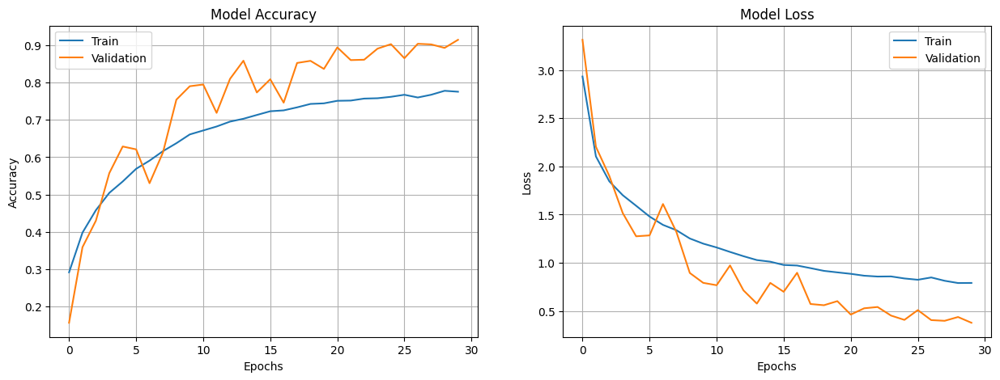

Loss on Test Dataset: 0.3674%
Accuracy on Test Dataset: 92.47%
CNN Error on Test Dataset: 7.53%


In [128]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_31_3_l1 = complex_model_31_3_l1.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_31_3_l1.save_weights('complex_model_31_3_l1_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_31_3_l1)

# Final evaluation of model
scores = complex_model_31_3_l1.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

<b><u>2. L2 regularization</u></b>

In [125]:
# Create model
complex_model_31_3_l2 = Sequential()

# Input layer
complex_model_31_3_l2.add(Conv2D(32, (3, 3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
complex_model_31_3_l2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_3_l2.add(Dropout(0.2))
# Convolutional layer
complex_model_31_3_l2.add(Conv2D(64, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l2.add(MaxPooling2D(pool_size=(2, 2)))
# Batch Normalization
complex_model_31_3_l2.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l2.add(Dropout(0.3))
# Convolutional layer
complex_model_31_3_l2.add(Conv2D(128, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l2.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout Layer
complex_model_31_3_l2.add(Dropout(0.2))

# Flatten Feature Map
complex_model_31_3_l2.add(Flatten())

# Fully Connected Dense Layer
complex_model_31_3_l2.add(Dense(128, activation='relu'))
# Batch Normalization
complex_model_31_3_l2.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l2.add(Dropout(0.2))
# Fully Connected Dense Layer
complex_model_31_3_l2.add(Dense(64, activation='relu'))
# Output layer
complex_model_31_3_l2.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(0.01)))

# Compile complex_model_31_3_l2
complex_model_31_3_l2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# complex_model_31_3_l2 summary
complex_model_31_3_l2.summary()

Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_104 (Conv2D)         (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_71 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_77 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_105 (Conv2D)         (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_72 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 batch_normalization_26 (Bat  (None, 6, 6, 64)       

Epoch 1/30
566/566 [==============================] - 10s 16ms/step - loss: 2.3583 - accuracy: 0.2846 - val_loss: 2.9424 - val_accuracy: 0.2113
Epoch 2/30
566/566 [==============================] - 9s 16ms/step - loss: 1.8857 - accuracy: 0.4104 - val_loss: 1.5416 - val_accuracy: 0.5133
Epoch 3/30
566/566 [==============================] - 9s 16ms/step - loss: 1.6694 - accuracy: 0.4746 - val_loss: 1.4822 - val_accuracy: 0.5220
Epoch 4/30
566/566 [==============================] - 9s 16ms/step - loss: 1.5414 - accuracy: 0.5172 - val_loss: 2.1690 - val_accuracy: 0.3850
Epoch 5/30
566/566 [==============================] - 9s 16ms/step - loss: 1.4263 - accuracy: 0.5525 - val_loss: 1.0845 - val_accuracy: 0.6750
Epoch 6/30
566/566 [==============================] - 9s 16ms/step - loss: 1.3336 - accuracy: 0.5869 - val_loss: 1.2165 - val_accuracy: 0.6247
Epoch 7/30
566/566 [==============================] - 9s 16ms/step - loss: 1.2657 - accuracy: 0.6061 - val_loss: 0.9439 - val_accuracy: 0.710

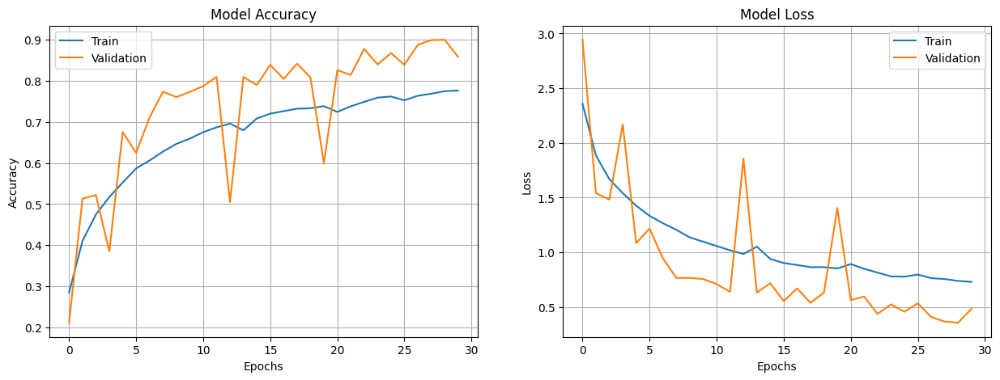

Loss on Test Dataset: 0.4393%
Accuracy on Test Dataset: 87.23%
CNN Error on Test Dataset: 12.77%


In [126]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_31_3_l2 = complex_model_31_3_l2.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_31_3_l2.save_weights('complex_model_31_3_l2_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_31_3_l2)

# Final evaluation of model
scores = complex_model_31_3_l2.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Hence, I will choose L1 regaluarizer.

<h3>2. Optimizers</h3>

1. Adam (Adaptive Moment Estimation)
    - Maintains two moving averages for each parameter: the first moment (mean) and the second moment (uncentered variance)
    - Adam adapts the learning rates for each parameter based on their historical gradients, making it well-suited for a variety of optimization problems
2. SGD (Stochastic Gradient Descent)
    - Updates the model parameters in the opposite direction of the gradient of the loss with respect to the parameters
    - Can suffer from slow convergence, especially in the presence of sparse or noisy gradients
3. RMSprop (Root Mean Square Propagation)
    - Focuses on accelerating the optimization process by decreasing the number of function evaluations to reach the local minimum
    - Keeps the moving average of squared gradients for every weight and divides the gradient by the square root of the mean square
    - <img src='https://av-eks-blogoptimized.s3.amazonaws.com/2169011.png'>

<h3><b><mark>A. Input size: 128 by 128 pixels</mark></b></h3>

<b><u>1. SGD</u></b>

In [46]:
complex_model_128_3_l2_SGD = Sequential()

# Convolutional Layer
complex_model_128_3_l2_SGD.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2_SGD.add(Conv2D(32, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2_SGD.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2_SGD.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l2_SGD.add(Conv2D(64, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2_SGD.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2_SGD.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2_SGD.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l2_SGD.add(Conv2D(128, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2_SGD.add(Conv2D(128, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2_SGD.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2_SGD.add(Dropout(0.4))

# Flatten the feature map
complex_model_128_3_l2_SGD.add(Flatten())

# Fully connected layer
complex_model_128_3_l2_SGD.add(Dense(128, activation='relu'))
# Batch Normalization layer
complex_model_128_3_l2_SGD.add(BatchNormalization())
# Dropout layer
complex_model_128_3_l2_SGD.add(Dropout(0.4))
# Outout layer
complex_model_128_3_l2_SGD.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(0.01)))

# Compile basedline_model_128
complex_model_128_3_l2_SGD.compile(loss='categorical_crossentropy', optimizer='SGD', metrics=['accuracy'])

# print the basedline_model_128 summary
complex_model_128_3_l2_SGD.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_32 (Conv2D)          (None, 126, 126, 32)      320       
                                                                 
 conv2d_33 (Conv2D)          (None, 124, 124, 32)      9248      
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 62, 62, 32)       0         
 g2D)                                                            
                                                                 
 dropout_21 (Dropout)        (None, 62, 62, 32)        0         
                                                                 
 conv2d_34 (Conv2D)          (None, 60, 60, 64)        18496     
                                                                 
 conv2d_35 (Conv2D)          (None, 58, 58, 64)        36928     
                                                     

Epoch 1/30
566/566 [==============================] - 45s 76ms/step - loss: 2.8847 - accuracy: 0.1160 - val_loss: 3.0840 - val_accuracy: 0.0667
Epoch 2/30
566/566 [==============================] - 45s 79ms/step - loss: 2.5944 - accuracy: 0.2242 - val_loss: 2.9150 - val_accuracy: 0.1540
Epoch 3/30
566/566 [==============================] - 46s 82ms/step - loss: 2.4015 - accuracy: 0.2791 - val_loss: 3.3412 - val_accuracy: 0.1527
Epoch 4/30
566/566 [==============================] - 62s 109ms/step - loss: 2.2418 - accuracy: 0.3240 - val_loss: 2.9560 - val_accuracy: 0.1753
Epoch 5/30
566/566 [==============================] - 53s 92ms/step - loss: 2.0427 - accuracy: 0.3776 - val_loss: 2.3544 - val_accuracy: 0.2707
Epoch 6/30
566/566 [==============================] - 55s 97ms/step - loss: 1.8702 - accuracy: 0.4377 - val_loss: 2.9764 - val_accuracy: 0.1540
Epoch 7/30
566/566 [==============================] - 52s 93ms/step - loss: 1.7281 - accuracy: 0.4770 - val_loss: 1.6205 - val_accuracy

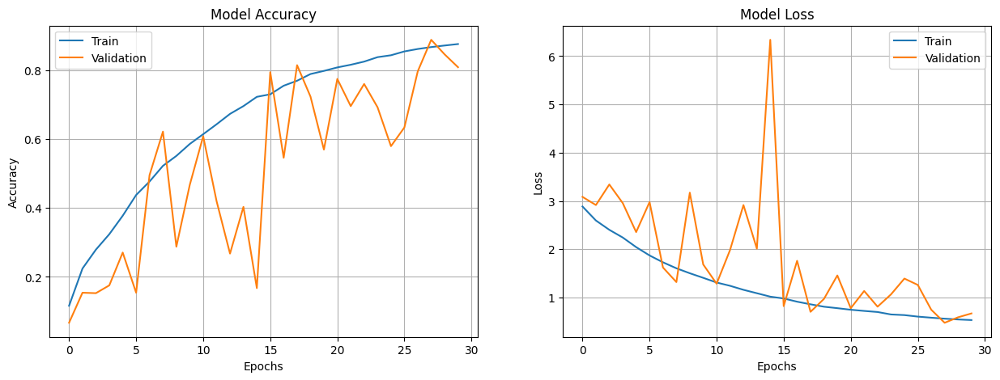

Loss on Test Dataset: 0.6769%
Accuracy on Test Dataset: 80.87%
CNN Error on Test Dataset: 19.13%


In [47]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_128_3_l2_SGD = complex_model_128_3_l2_SGD.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_128_3_l2_SGD.save_weights('complex_model_128_3_l2_SGD_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_128_3_l2_SGD)

# Final evaluation of model
scores = complex_model_128_3_l2_SGD.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

<b><u>2. RMSprop</u></b>

In [48]:
complex_model_128_3_l2_RMSprop = Sequential()

# Convolutional Layer
complex_model_128_3_l2_RMSprop.add(Conv2D(32, (3,3), input_shape=(128, 128, 1), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2_RMSprop.add(Conv2D(32, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2_RMSprop.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2_RMSprop.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l2_RMSprop.add(Conv2D(64, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2_RMSprop.add(Conv2D(64, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2_RMSprop.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2_RMSprop.add(Dropout(0.4))
# Convolutional Layer
complex_model_128_3_l2_RMSprop.add(Conv2D(128, (3,3), activation='relu'))
# Convolutional Layer
complex_model_128_3_l2_RMSprop.add(Conv2D(128, (3,3), activation='relu'))
# Pooling layer
complex_model_128_3_l2_RMSprop.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_128_3_l2_RMSprop.add(Dropout(0.4))

# Flatten the feature map
complex_model_128_3_l2_RMSprop.add(Flatten())

# Fully connected layer
complex_model_128_3_l2_RMSprop.add(Dense(128, activation='relu'))
# Batch Normalization layer
complex_model_128_3_l2_RMSprop.add(BatchNormalization())
# Dropout layer
complex_model_128_3_l2_RMSprop.add(Dropout(0.4))
# Outout layer
complex_model_128_3_l2_RMSprop.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l2(0.01)))

# Compile basedline_model_128
complex_model_128_3_l2_RMSprop.compile(loss='categorical_crossentropy', optimizer='RMSprop', metrics=['accuracy'])

# print the basedline_model_128 summary
complex_model_128_3_l2_RMSprop.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_38 (Conv2D)          (None, 126, 126, 32)      320       
                                                                 
 conv2d_39 (Conv2D)          (None, 124, 124, 32)      9248      
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 62, 62, 32)       0         
 g2D)                                                            
                                                                 
 dropout_25 (Dropout)        (None, 62, 62, 32)        0         
                                                                 
 conv2d_40 (Conv2D)          (None, 60, 60, 64)        18496     
                                                                 
 conv2d_41 (Conv2D)          (None, 58, 58, 64)        36928     
                                                     

Epoch 1/30
566/566 [==============================] - 33s 44ms/step - loss: 2.3277 - accuracy: 0.2880 - val_loss: 2.0907 - val_accuracy: 0.3513
Epoch 2/30
566/566 [==============================] - 21s 37ms/step - loss: 1.6620 - accuracy: 0.4824 - val_loss: 2.5262 - val_accuracy: 0.2817
Epoch 3/30
566/566 [==============================] - 18s 31ms/step - loss: 1.3595 - accuracy: 0.5903 - val_loss: 1.9372 - val_accuracy: 0.4583
Epoch 4/30
566/566 [==============================] - 15s 25ms/step - loss: 1.1428 - accuracy: 0.6634 - val_loss: 0.9575 - val_accuracy: 0.7050
Epoch 5/30
566/566 [==============================] - 15s 25ms/step - loss: 0.9473 - accuracy: 0.7259 - val_loss: 1.0391 - val_accuracy: 0.6977
Epoch 6/30
566/566 [==============================] - 15s 25ms/step - loss: 0.7937 - accuracy: 0.7774 - val_loss: 0.6227 - val_accuracy: 0.8240
Epoch 7/30
566/566 [==============================] - 14s 25ms/step - loss: 0.6865 - accuracy: 0.8113 - val_loss: 1.0153 - val_accuracy:

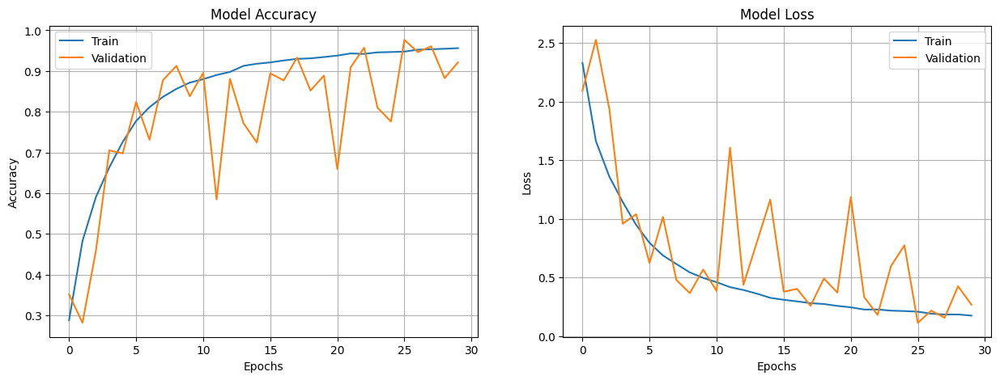

Loss on Test Dataset: 0.2576%
Accuracy on Test Dataset: 92.73%
CNN Error on Test Dataset: 7.27%


In [49]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_128_3_l2_RMSprop = complex_model_128_3_l2_RMSprop.fit(train_ds_128_dataAug_rescaled, validation_data = validation_ds_128_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_128_3_l2_RMSprop.save_weights('complex_model_128_3_l2_RMSprop_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_128_3_l2_RMSprop)

# Final evaluation of model
scores = complex_model_128_3_l2_RMSprop.evaluate(test_ds_128_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Insights:
- It appears the adam is the optimal optimizer for this model.
- I will stick to adam as the optimizer.

<h3><b><mark>B. Input size: 31 by 31 pixels</mark></b></h3>

<b><u>1. SGD</u></b>

In [130]:
# Create model
complex_model_31_3_l1_SGD = Sequential()

# Input layer
complex_model_31_3_l1_SGD.add(Conv2D(32, (3, 3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
complex_model_31_3_l1_SGD.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_3_l1_SGD.add(Dropout(0.2))
# Convolutional layer
complex_model_31_3_l1_SGD.add(Conv2D(64, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l1_SGD.add(MaxPooling2D(pool_size=(2, 2)))
# Batch Normalization
complex_model_31_3_l1_SGD.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l1_SGD.add(Dropout(0.3))
# Convolutional layer
complex_model_31_3_l1_SGD.add(Conv2D(128, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l1_SGD.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout Layer
complex_model_31_3_l1_SGD.add(Dropout(0.2))

# Flatten Feature Map
complex_model_31_3_l1_SGD.add(Flatten())

# Fully Connected Dense Layer
complex_model_31_3_l1_SGD.add(Dense(128, activation='relu'))
# Batch Normalization
complex_model_31_3_l1_SGD.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l1_SGD.add(Dropout(0.2))
# Fully Connected Dense Layer
complex_model_31_3_l1_SGD.add(Dense(64, activation='relu'))
# Output layer
complex_model_31_3_l1_SGD.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l1(0.01)))

# Compile complex_model_31_3_l1_SGD
complex_model_31_3_l1_SGD.compile(loss='categorical_crossentropy', optimizer='SGD', metrics=['accuracy'])

# complex_model_31_3_l1_SGD summary
complex_model_31_3_l1_SGD.summary()

Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_113 (Conv2D)         (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_80 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_89 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_114 (Conv2D)         (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_81 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 batch_normalization_32 (Bat  (None, 6, 6, 64)       

Epoch 1/30
566/566 [==============================] - 10s 17ms/step - loss: 3.5758 - accuracy: 0.1803 - val_loss: 3.5372 - val_accuracy: 0.1100
Epoch 2/30
566/566 [==============================] - 9s 16ms/step - loss: 2.8657 - accuracy: 0.2602 - val_loss: 3.0252 - val_accuracy: 0.1667
Epoch 3/30
566/566 [==============================] - 9s 16ms/step - loss: 2.4943 - accuracy: 0.3018 - val_loss: 2.9160 - val_accuracy: 0.1827
Epoch 4/30
566/566 [==============================] - 9s 16ms/step - loss: 2.3122 - accuracy: 0.3240 - val_loss: 2.7399 - val_accuracy: 0.2093
Epoch 5/30
566/566 [==============================] - 9s 16ms/step - loss: 2.2179 - accuracy: 0.3406 - val_loss: 2.4555 - val_accuracy: 0.2813
Epoch 6/30
566/566 [==============================] - 9s 16ms/step - loss: 2.1510 - accuracy: 0.3471 - val_loss: 2.3253 - val_accuracy: 0.2807
Epoch 7/30
566/566 [==============================] - 9s 16ms/step - loss: 2.0935 - accuracy: 0.3656 - val_loss: 3.6947 - val_accuracy: 0.139

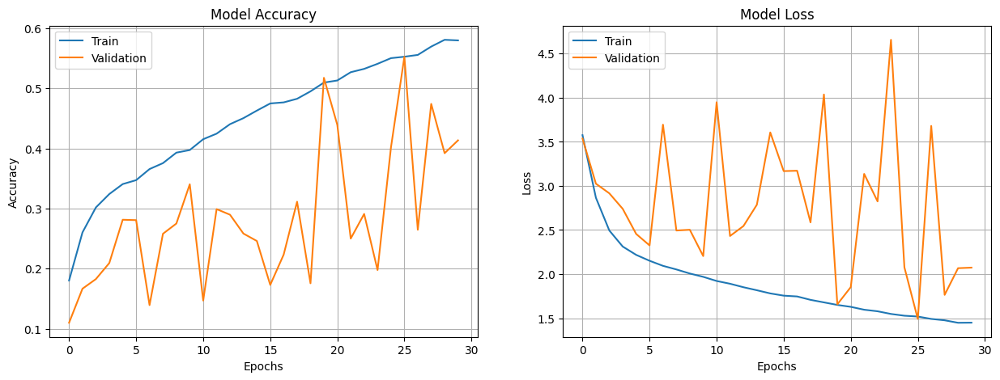

Loss on Test Dataset: 2.0769%
Accuracy on Test Dataset: 41.20%
CNN Error on Test Dataset: 58.80%


In [131]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_31_3_l1_SGD = complex_model_31_3_l1_SGD.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_31_3_l1_SGD.save_weights('complex_model_31_3_l1_SGD_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_31_3_l1_SGD)

# Final evaluation of model
scores = complex_model_31_3_l1_SGD.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

<b><u>2. RMSprop</u></b>

In [132]:
# Create model
complex_model_31_3_l1_RMSprop = Sequential()

# Input layer
complex_model_31_3_l1_RMSprop.add(Conv2D(32, (3, 3), input_shape=(31, 31, 1), activation='relu'))
# Pooling layer
complex_model_31_3_l1_RMSprop.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout layer
complex_model_31_3_l1_RMSprop.add(Dropout(0.2))
# Convolutional layer
complex_model_31_3_l1_RMSprop.add(Conv2D(64, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l1_RMSprop.add(MaxPooling2D(pool_size=(2, 2)))
# Batch Normalization
complex_model_31_3_l1_RMSprop.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l1_RMSprop.add(Dropout(0.3))
# Convolutional layer
complex_model_31_3_l1_RMSprop.add(Conv2D(128, (3, 3), activation='relu'))
# Pooling layer
complex_model_31_3_l1_RMSprop.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout Layer
complex_model_31_3_l1_RMSprop.add(Dropout(0.2))

# Flatten Feature Map
complex_model_31_3_l1_RMSprop.add(Flatten())

# Fully Connected Dense Layer
complex_model_31_3_l1_RMSprop.add(Dense(128, activation='relu'))
# Batch Normalization
complex_model_31_3_l1_RMSprop.add(BatchNormalization())
# Dropout layer
complex_model_31_3_l1_RMSprop.add(Dropout(0.2))
# Fully Connected Dense Layer
complex_model_31_3_l1_RMSprop.add(Dense(64, activation='relu'))
# Output layer
complex_model_31_3_l1_RMSprop.add(Dense(num_classes, activation='softmax', kernel_regularizer=tf.keras.regularizers.l1(0.01)))

# Compile complex_model_31_3_l1_RMSprop
complex_model_31_3_l1_RMSprop.compile(loss='categorical_crossentropy', optimizer='RMSprop', metrics=['accuracy'])

# complex_model_31_3_l1_RMSprop summary
complex_model_31_3_l1_RMSprop.summary()

Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_116 (Conv2D)         (None, 29, 29, 32)        320       
                                                                 
 max_pooling2d_83 (MaxPoolin  (None, 14, 14, 32)       0         
 g2D)                                                            
                                                                 
 dropout_93 (Dropout)        (None, 14, 14, 32)        0         
                                                                 
 conv2d_117 (Conv2D)         (None, 12, 12, 64)        18496     
                                                                 
 max_pooling2d_84 (MaxPoolin  (None, 6, 6, 64)         0         
 g2D)                                                            
                                                                 
 batch_normalization_34 (Bat  (None, 6, 6, 64)       

Epoch 1/30
566/566 [==============================] - 13s 22ms/step - loss: 2.8488 - accuracy: 0.3046 - val_loss: 4.1328 - val_accuracy: 0.1343
Epoch 2/30
566/566 [==============================] - 13s 22ms/step - loss: 2.0210 - accuracy: 0.4268 - val_loss: 1.8131 - val_accuracy: 0.4623
Epoch 3/30
566/566 [==============================] - 12s 22ms/step - loss: 1.7680 - accuracy: 0.4954 - val_loss: 1.8614 - val_accuracy: 0.4670
Epoch 4/30
566/566 [==============================] - 12s 22ms/step - loss: 1.6290 - accuracy: 0.5337 - val_loss: 1.7904 - val_accuracy: 0.5040
Epoch 5/30
566/566 [==============================] - 13s 22ms/step - loss: 1.5215 - accuracy: 0.5670 - val_loss: 2.7096 - val_accuracy: 0.3207
Epoch 6/30
566/566 [==============================] - 13s 22ms/step - loss: 1.4421 - accuracy: 0.5953 - val_loss: 2.0515 - val_accuracy: 0.4377
Epoch 7/30
566/566 [==============================] - 11s 20ms/step - loss: 1.3734 - accuracy: 0.6200 - val_loss: 3.9379 - val_accuracy:

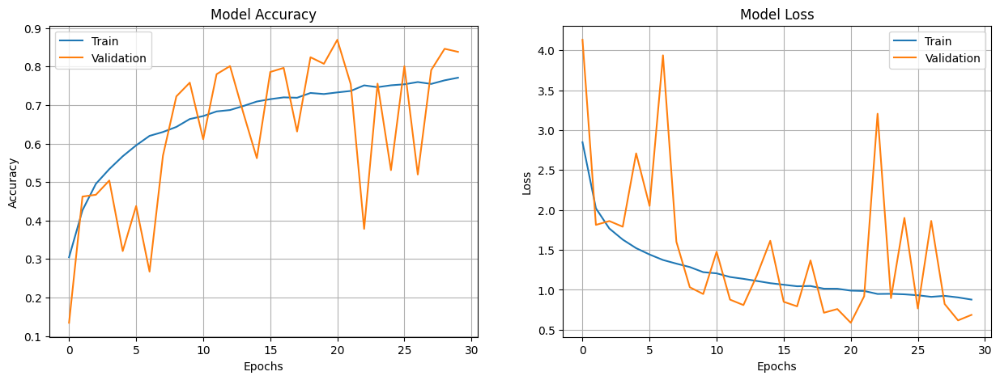

Loss on Test Dataset: 0.6771%
Accuracy on Test Dataset: 83.73%
CNN Error on Test Dataset: 16.27%


In [133]:
# Fit model with rescaled & data augmented train dataset
history_complex_model_31_3_l1_RMSprop = complex_model_31_3_l1_RMSprop.fit(train_ds_31_dataAug_rescaled, validation_data = validation_ds_31_rescaled, epochs = 30, verbose = 1)

# Save model weights
complex_model_31_3_l1_RMSprop.save_weights('complex_model_31_3_l1_RMSprop_weights.h5')

# Summarize history for accuracy & loss
plotCompareMetrics(history_complex_model_31_3_l1_RMSprop)

# Final evaluation of model
scores = complex_model_31_3_l1_RMSprop.evaluate(test_ds_31_rescaled, verbose = 0)
print("Loss on Test Dataset: %.4f%%" % (scores[0]))
print("Accuracy on Test Dataset: %.2f%%" % (scores[1]*100))
print("CNN Error on Test Dataset: %.2f%%" % (100 - scores[1]*100))

Hence, I will stick to adam for the optimizer

<hr>
<h2><mark>6. Model Evaluation</mark></h2>

<h3><b><mark>A. Input size: 128 by 128 pixels</mark></b></h3>

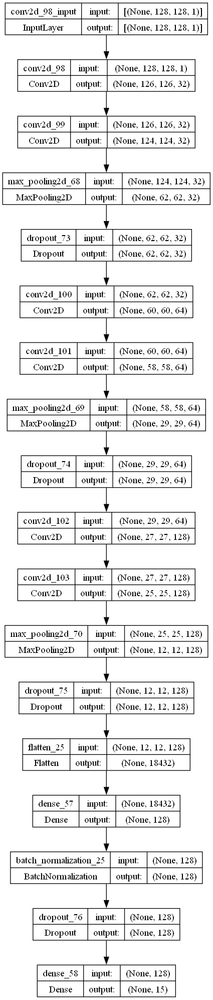

In [118]:
tf.keras.utils.plot_model(complex_model_128_3_l2, show_shapes=True)

In [119]:
# Load weights
complex_model_128_3_l2.load_weights('cnn_complex_model_128_3_l2_best_weights.h5')

94/94 [==============================] - 1s 16ms/step


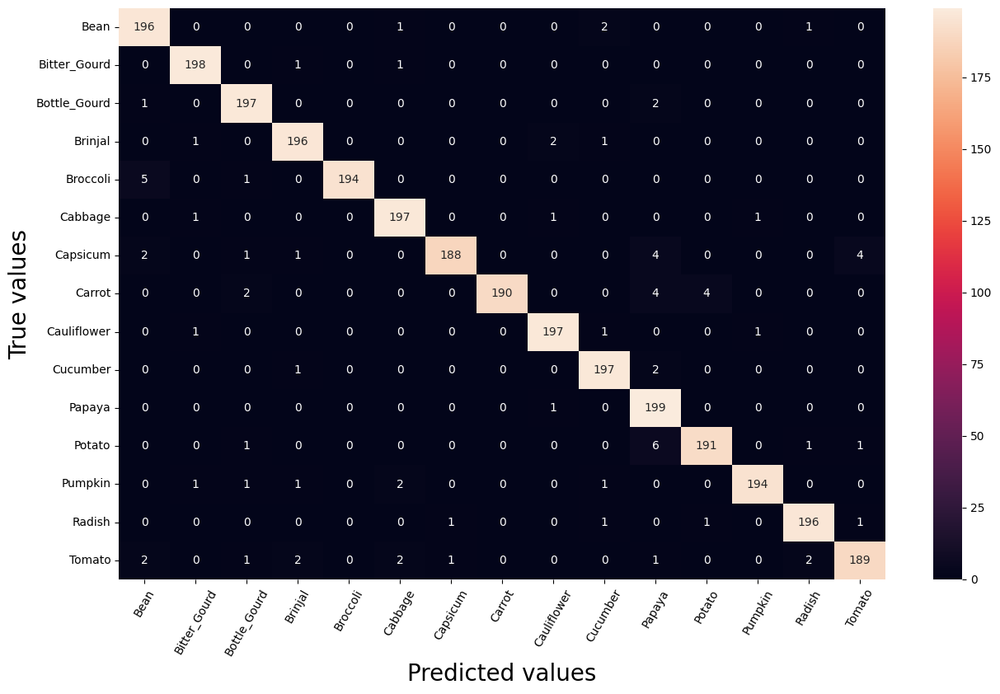

In [107]:
# Make Predictions on Test Dataset
y_trueLabels_128, y_preds_128, trueClass_128, FalseClass_128 = makePredictions(complex_model_128_3_l2, test_ds_128_rescaled, class_names)
# Plot Confusion Matrix
plot_confusion_matrix(y_trueLabels_128, y_preds_128, class_names)

- Most Labels Getting Mixed Up
    - Capsicum:
        - 12 wrongly classified as Tomato, Papaya, Bean, Brinjal, Bottle_Groud
    - Tomato:
        - 11 wrongly classified as Radish, Potato, Cabbage, Bean, Brinjal

- Otherwise, the model is able to predict most labels accurately with less than 10 samples wrongly classified

<h3><b><mark>B. Input size: 31 by 31 pixels</mark></b></h3>

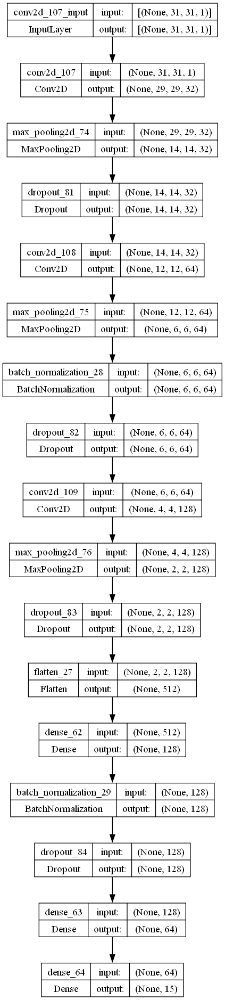

In [139]:
tf.keras.utils.plot_model(complex_model_31_3_l1, show_shapes=True)

In [140]:
# load weights
complex_model_31_3_l1.load_weights('cnn_complex_model_31_3_l1_best_weights.h5')

94/94 [==============================] - 0s 2ms/step


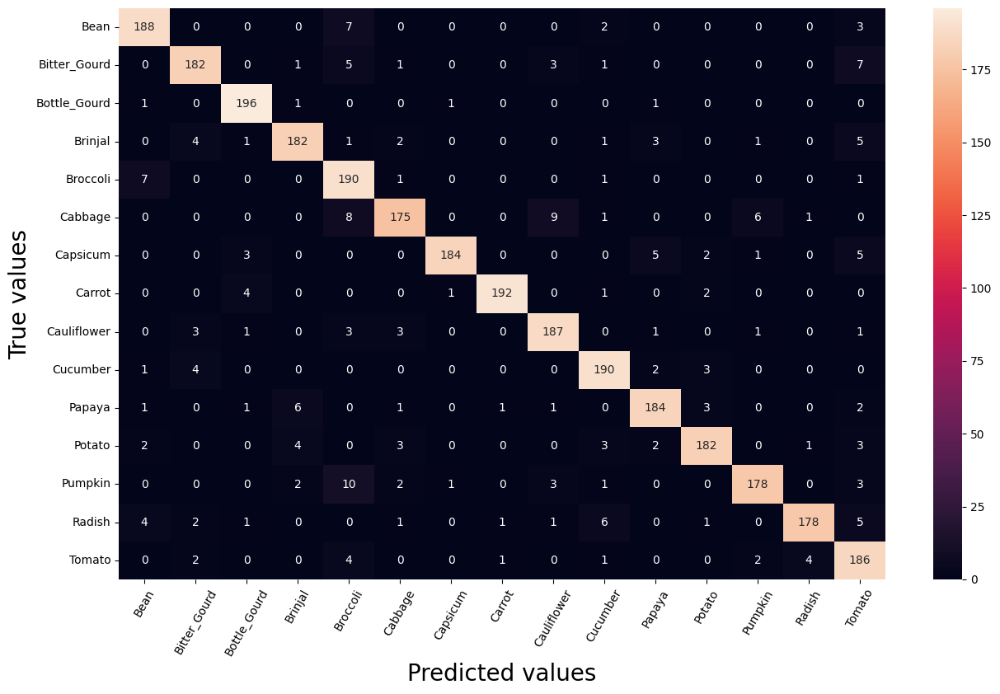

In [141]:
# Make Predictions on Test Dataset
y_trueLabels_31, y_preds_31, trueClass_31, FalseClass_31 = makePredictions(complex_model_31_3_l1, test_ds_31_rescaled, class_names)
# Plot Confusion Matrix
plot_confusion_matrix(y_trueLabels_31, y_preds_31, class_names)

- Most Labels Getting Mixed Up
    - Cabbage:
        - 25 wrongly classified as Cauliflower, Pumpkin, Broccoli
    - Radish:
        - 11 wrongly classified as Radish, Potato, Cabbage, Bean, Brinjal

- Otherwise, the model is able to predict most labels accurately

- Compared to 128x128, 31x31 has more errors in identifying the labels

<hr>
<h2><mark>7. Error Analysis</mark></h2>

<h3><b><mark>A. Input size: 128 by 128 pixels</mark></b></h3>

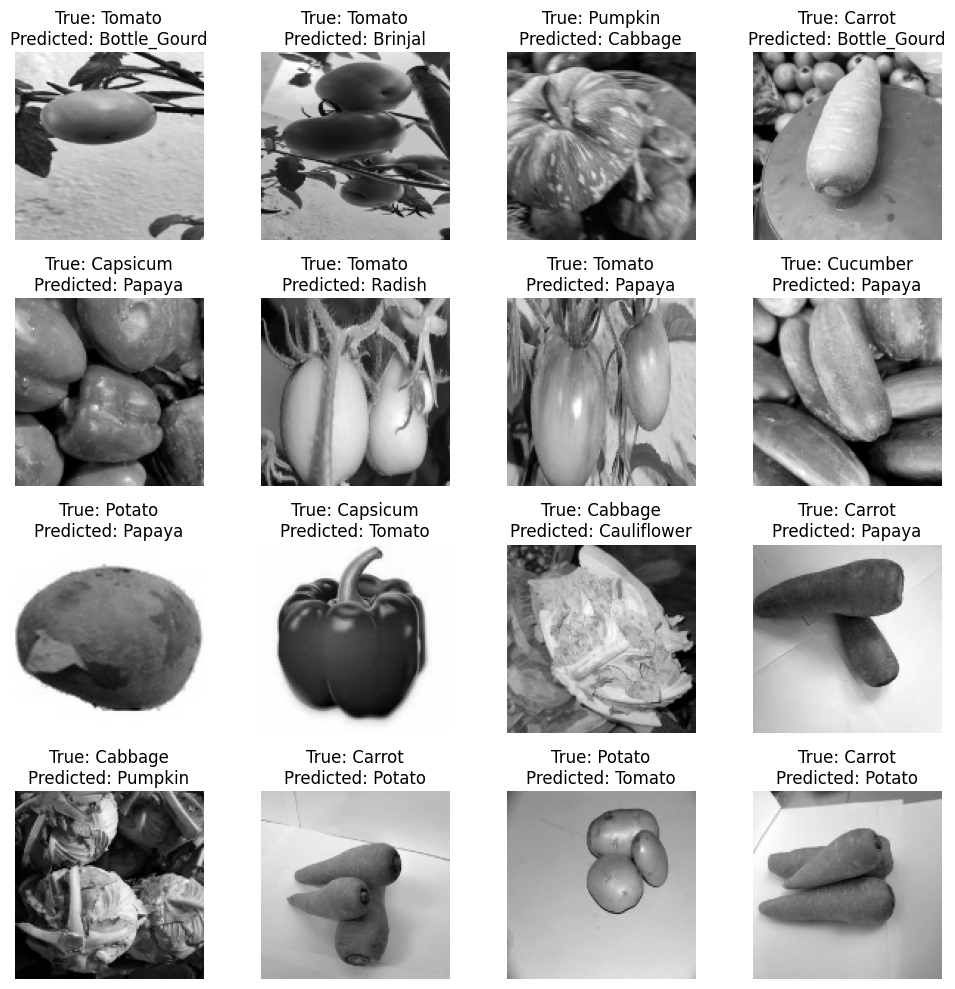

In [124]:
plot_prediction(FalseClass_128)

Insights:

1. The model gets confused between Capsicum/Tomato due to their similar circular shape and Carrot/Potato/Papaya due to similar oval shape
2. The model fails to correctly classifiy the vegetable as the test images are stretched or taken form an awkward angle as seen in the tomato images

<h3><b><mark>B. Input size: 31 by 31 pixels</mark></b></h3>

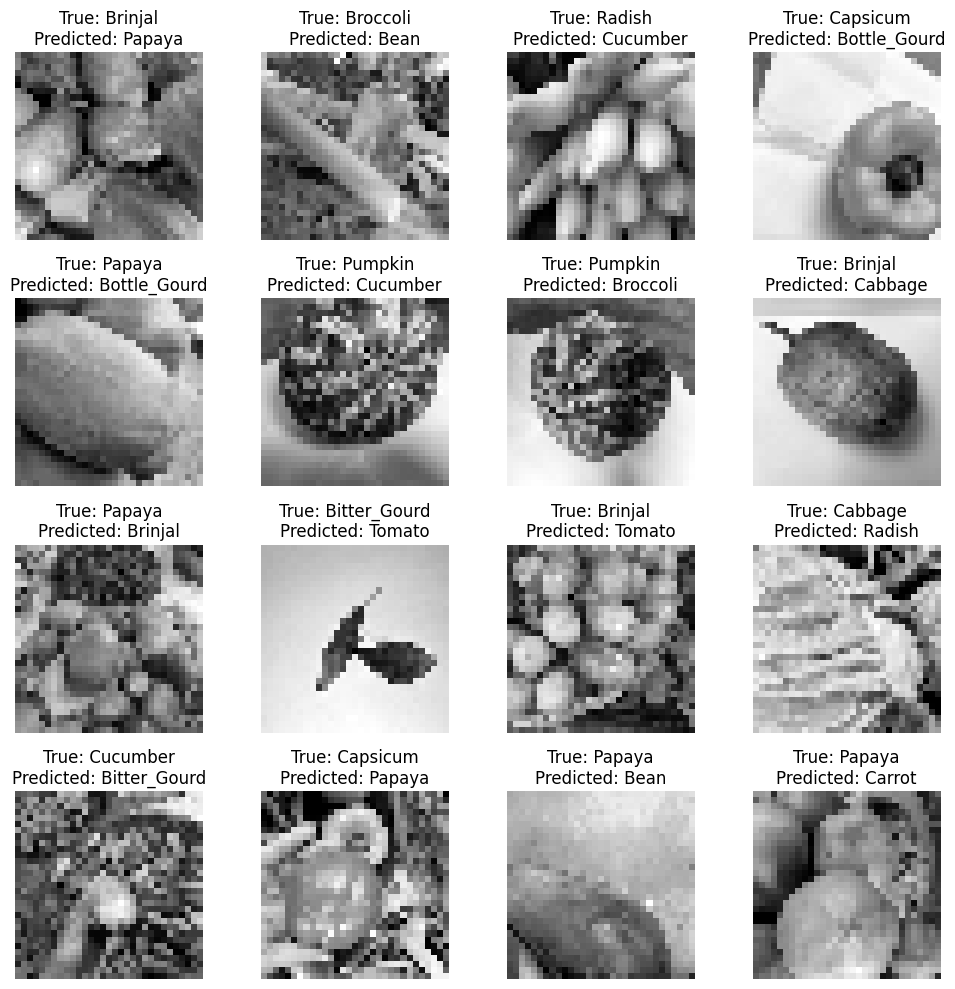

In [142]:
plot_prediction(FalseClass_31)

Insights:
- Similarly, the model gets confused between vegetables such as Brinjal/Tomato due to their similar circular shape 

- However, there are instances whereby the vegetables have different shapes but the model still wrongly classifies it.
    - Bitter Gourd has an oval shape while Tomato has a circular shape

- At 31 x 31 pixels, the shapes are harder to be captured by the model.